In [2]:
import math
import io
import torch
import torchvision
from torchvision import transforms
import numpy as np

from PIL import Image

import matplotlib.pyplot as plt
import pybboxes as pbx
import json
from pybboxes import BoundingBox
from sklearn.metrics import average_precision_score
import numpy
import matplotlib.pyplot as plt
import os
from scipy import integrate
from numpy import trapz
import random
import cv2
from compressai.zoo import models as pretrained_models

In [2]:
from compressai.zoo import (bmshj2018_factorized, bmshj2018_hyperprior, mbt2018_mean, mbt2018, cheng2020_anchor)

/home/dariats/.local/lib/python3.8/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [27]:
net = pretrained_models['cheng2020-attn'](quality=4,pretrained = True).eval().to(device)

Downloading: "https://compressai.s3.amazonaws.com/models/v1/cheng2020_attn-mse-4-f7b0ccf2.pth.tar" to /home/dariats/.cache/torch/hub/checkpoints/cheng2020_attn-mse-4-f7b0ccf2.pth.tar


  0%|          | 0.00/121M [00:00<?, ?B/s]

KeyboardInterrupt: 

In [ ]:
net = bmshj2018_factorized(quality=1, pretrained=True).eval().to(device)

In [ ]:
net = mbt2018_mean(quality=8, pretrained=True).eval().to(device)

In [ ]:
net = cheng2020_anchor(quality=1, pretrained=True).eval().to(device)

In [ ]:
img = Image.open('/home/dariats/Downloads/darknet/coco/images/train2014/COCO_train2014_000000000025.jpg').convert('RGB')
x = transforms.ToTensor()(img).unsqueeze(0).to(device)
print(img.size)

In [ ]:
%matplotlib inline
plt.figure(figsize=(12, 9))
plt.axis('off')
plt.imshow(img)
plt.show()

In [ ]:
h, w = img.size
h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
with torch.no_grad():
    out_net = net.forward(x)
out_net['x_hat'].clamp_(0, 1)

print(out_net.keys())

In [ ]:
rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
print(rec_net.size)

In [ ]:
%matplotlib inline
fix, axes = plt.subplots(1, 2, figsize=(16, 12))
for ax in axes:
    ax.axis('off')
    
axes[0].imshow(img)
axes[0].title.set_text('Original')

axes[1].imshow(rec_net)
axes[1].title.set_text('Reconstructed')


plt.show()

In [8]:
def compute_psnr(a, b):
    mse = torch.mean((a - b)**2).item()
    return -10 * math.log10(mse)

def compute_msssim(a, b):
    return ms_ssim(a, b, data_range=1.).item()

def compute_bpp(out_net):
    size = out_net['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    return sum(torch.log(likelihoods).sum() / (-math.log(2) * num_pixels)
              for likelihoods in out_net['likelihoods'].values()).item()

In [ ]:
#print(f'PSNR: {compute_psnr(x, out_net["x_hat"]):.2f}dB')
#print(f'MS-SSIM: {compute_msssim(x, out_net["x_hat"]):.4f}')
print(f'Bit-rate: {compute_bpp(out_net):.3f} bpp')

In [9]:
import torch.nn.functional as F
def pad(x, p=2**6):
    h, w = x.size(2), x.size(3)
    H = (h + p - 1) // p * p
    W = (w + p - 1) // p * p
    padding_left = (W - w) // 2
    padding_right = W - w - padding_left
    padding_top = (H - h) // 2
    padding_bottom = H - h - padding_top
    return padding_left, padding_bottom, F.pad(
        x,
        (padding_left, padding_right, padding_top, padding_bottom),
        mode="constant",
        value=0,
    )

## YOLOv4

In [ ]:
rec_net = rec_net.save('data/compressed.jpg')

In [ ]:
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights

In [ ]:
!./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights /home/dariats/Downloads/darknet/coco/images/train2014/COCO_train2014_000000000036.jpg -ext_output -dont_show -out img_results/resulttest.json

In [ ]:
!./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights -dont_show -ext_output -out results.json < /home/dariats/Downloads/darknet/coco/trainvalno5k.txt

In [ ]:
!./darknet detector valid cfg/coco.data cfg/yolov4.cfg yolov4.weights

In [ ]:
!./darknet detector map cfg/coco.data cfg/yolov4.cfg yolov4.weights

In [ ]:
!./darknet detector map cfg/coco.data cfg/yolov4.cfg yolov4.weights

In [ ]:
import json
with open('/home/dariats/Downloads/darknet/coco/annotations/instances_train2014.json', 'r') as fcc_file:
    fcc_data = json.load(fcc_file)

In [ ]:
for item in fcc_data['annotations']:
    if item['image_id'] == 25:
        print(item)

In [ ]:
f = open('/home/dariats/Downloads/darknet/coco/trainvalno5k.txt', 'r')
count = 0
for line in f:
    img = Image.open(line[:-1]).convert('RGB')
    img.save(f'/home/dariats/Downloads/darknet/coco/images2014train/{line[54:-1]}')

In [ ]:
import fiftyone as fo

dataset = fo.load_dataset("/home/dariats/Downloads/darknet/coco/images2014train")

results = dataset.evaluate_detections(
    pred_field="predictions",
    gt_field="ground_truth",
    eval_key="eval_coco",
    compute_mAP=True,
)

print(results.mAP())

In [ ]:
def imShow(path):
    import cv2
    import matplotlib.pyplot as plt
    %matplotlib inline

    image = cv2.imread(path)
    height, width = image.shape[:2]
    resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
imShow('predictions.jpg')

## Computing mAP

In [ ]:
map = 0
for i in range(len(vecs)):
    y_true = numpy.array(vecs[i])
    y_scores = numpy.array(ious[i])
    ap = average_precision_score(y_true, y_scores)
    map += ap
    print(f"{i}: {ap}")
    
map = map/len(vecs)
print('MAP:', map)

## iou-bpp curves

In [ ]:
import matplotlib.pyplot as plt
import os
from scipy import integrate
from numpy import trapz

In [ ]:
networks = {}

In [ ]:
networks2 = {}

In [ ]:
def img_compress(adr, net, quality):
    img = Image.open(adr).convert('RGB')
    h, w = img.size
    #x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
    with torch.no_grad():
        out_net = net.forward(x)
    out_net['x_hat'].clamp_(0, 1) 
    rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
    l = len(adr)
    #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/{quality}{adr[l-16::]}'
    str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
    #print(str1)
    rec_net = rec_net.save(str1)
    bpp = round(compute_bpp(out_net), 3)
    return str1, bpp

In [68]:
with open('/home/dariats/Downloads/darknet/coco/annotations/instances_train2014.json', 'r') as true_file:
    true_data = json.load(true_file)

In [69]:
print(true_data['categories'])

[{'supercategory': 'person', 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'}, {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'}, {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'}, {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'}, {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'}, {'supercategory': 'animal', 'id': 16, 'name': 'bird'}, {'supercategory': 'animal', 'id': 17, 'name': 'cat'}, {'supercategory': 'animal', 'id': 18, 'name': 'dog'}, {'supercategory

In [ ]:
true_res = '/home/dariats/Downloads/darknet/img_results/true_res.json'

In [ ]:
adr = '/home/dariats/Downloads/darknet/coco/images/train2014/COCO_train2014_000000000754.jpg'

In [ ]:
os.system(f"./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights {adr} -ext_output -dont_show -out {true_res}")

In [ ]:
def av_iou(adr):
    with open(adr, 'r') as pred_file:
        pred_data = json.load(pred_file)
    l = len(pred_data[0]['filename'])
    id = pred_data[0]['filename'][(l-16):-4]
    true_bboxes = []
    names = []
    for item in true_data['annotations']:
        if item['image_id'] == int(id):
            true_bboxes.append(item['bbox'])
            names.append(next(x['name'] for x in true_data['categories'] if x['id'] == item['category_id']))
    img = Image.open(pred_data[0]['filename']).convert('RGB')
    W,H = img.size
    vecs = []
    ious=[]
    for i in range(80):
        vecs.append([])
        ious.append([])
    avg_iou = 0
    iou_count = 0

    for object in pred_data[0]['objects']:
        i = 0
        while (i != len(names)):
            if (object['name'] != names[i]):
                i+=1
                continue
            cen_x = object['relative_coordinates']['center_x']
            cen_y = object['relative_coordinates']['center_y']
            wid = object['relative_coordinates']['width']
            hei = object['relative_coordinates']['height']
            yolo_bbox = (cen_x, cen_y, wid, hei)
            #print(yolo_bbox)
            yolo_bbox = pbx.convert_bbox(yolo_bbox, from_type="yolo", to_type="coco", image_size=(W, H), strict = False)
            coco_bbox = BoundingBox.from_coco(*yolo_bbox, image_size=(W,H))
            coco_bbox2 = BoundingBox.from_coco(*true_bboxes[i], image_size=(W,H))
            iou = coco_bbox.iou(coco_bbox2)
            avg_iou+=iou
            iou_count+=1
            if iou > iou_tresh:
                vecs[object['class_id']].append(1)
            else:
                vecs[object['class_id']].append(0)
            ious[object['class_id']].append(iou)
            true_bboxes.pop(i)
            names.pop(i)
            break
    avg_iou = avg_iou/(iou_count+len(names))
    return avg_iou

In [ ]:
def av_iou2(res):
    with open(res, 'r') as pred_file:
        pred_data = json.load(pred_file)
    #print(adr1)
    with open('/home/dariats/Downloads/darknet/results.json', 'r') as pred_true_file:
        pred_tr = json.load(pred_true_file)
    for item in pred_tr:
        if item['filename'] == adr:
            pred_tr_data = item
            break
    
    conf_tresh = 0.4
    i = 0
    while i <(len(pred_tr_data['objects'])):
        if pred_tr_data['objects'][i]["confidence"] < conf_tresh:
            pred_tr_data['objects'].pop(i)
        else:
            i+=1
            
    img = Image.open(pred_data[0]['filename']).convert('RGB')
    W,H = img.size
    ious=[]
    for i in range(80):
        ious.append([])
    avg_iou = 0
    iou_count = 0
    
    pred_data = pred_data[0]["objects"]
 
    for object in pred_data:
        if object['confidence'] < conf_tresh:
            continue
        max_iou = 0
        cen_x = object['relative_coordinates']['center_x']
        cen_y = object['relative_coordinates']['center_y']
        wid = object['relative_coordinates']['width']
        hei = object['relative_coordinates']['height']
        yolo_bbox = (cen_x, cen_y, wid, hei)
        yolo_bbox = tuple(np.clip(yolo_bbox, 0, 1))
        yolo_bbox = pbx.convert_bbox(yolo_bbox, from_type="yolo", to_type="coco", image_size=(W, H), strict = False)
        coco_bbox = BoundingBox.from_coco(*yolo_bbox, image_size=(W,H), strict = False)
        
        for object_tr in pred_tr_data['objects']:
            if (object['name'] != object_tr['name']):
                i+=1
                continue                                 
            cen_x = object_tr['relative_coordinates']['center_x']
            cen_y = object_tr['relative_coordinates']['center_y']
            wid = object_tr['relative_coordinates']['width']
            hei = object_tr['relative_coordinates']['height']
            yolo_bbox_tr = (cen_x, cen_y, wid, hei)
            yolo_bbox_tr = tuple(np.clip(yolo_bbox_tr, 0, 1)) 
            yolo_bbox_tr = pbx.convert_bbox(yolo_bbox_tr, from_type="yolo", to_type="coco", image_size=(W, H), strict = False)
            coco_bbox2 = BoundingBox.from_coco(*yolo_bbox_tr, image_size=(W,H), strict = False)
            iou = coco_bbox.iou(coco_bbox2)
            if iou > max_iou:
                max_iou = iou
            
        if (max_iou > 0):
            avg_iou+=max_iou
            iou_count+=1
        
    if (iou_count+(len(pred_tr_data['objects']) - iou_count) > 0):   
        avg_iou = avg_iou/(iou_count+(len(pred_tr_data['objects']) - iou_count))
    return pred_data, avg_iou

In [ ]:
bpps = []
ious = []
for quality in range(1,9):
    net = bmshj2018_factorized(quality=quality, pretrained=True).eval().to(device)
    adr1, bpp =img_compress(adr, net, quality)
    bpps.append(bpp)
    res_name = f'/home/dariats/Downloads/darknet/img_results/quality{quality}.json'
    os.system(f"./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights {adr1} -ext_output -dont_show -out {res_name}")
    ious.append(av_iou2(res_name))
    
networks["bmshj2018_factorized"] = [bpps, ious]
print(networks)

Jpeg

In [5]:
def pillow_encode(img, fmt='jpeg', quality=10):
    tmp = io.BytesIO()
    img.save(tmp, format=fmt, quality=quality)
    tmp.seek(0)
    filesize = tmp.getbuffer().nbytes
    bpp = filesize * float(8) / (img.size[0] * img.size[1])
    rec = Image.open(tmp).convert("RGB")
    return rec, bpp

def find_closest_bpp(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    for i in range(10):
        mid = (upper - lower) / 2 + lower
        if int(mid) == int(prev_mid):
            break
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        if bpp > target:
            upper = mid - 1
        else:
            lower = mid
    return rec, bpp

## Webp vs cheng2020

In [ ]:
import datetime

In [ ]:
def compute_integrate(adr):
    data = {}
    #networks = {}
    bpps = []
    ious = []
    data["cheng2020_anchor"] = {}
    for quality in range(1,7):
        data["cheng2020_anchor"][quality] = {}
        net = cheng2020_anchor(quality=quality, pretrained=True).eval().to(device)
        adr1, bpp =img_compress(adr, net, quality)
        bpps.append(bpp)
        res_name = f'/home/dariats/Downloads/darknet/img_results/quality{quality}.json'
        os.system(f"./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights {adr1} -ext_output -dont_show -out {res_name}")
        objects, iou = av_iou2(res_name)
        data["cheng2020_anchor"][quality] = objects
        ious.append(iou)
    data["cheng2020_anchor"]["curves"] = {}
    data["cheng2020_anchor"]["curves"] = [bpps, ious]
    x = bpps[len(bpps) - 1]- bpps[0]
    data["cheng2020_anchor"]["integrate"] = integrate.trapz(ious, bpps)/x
    target_bpps = bpps
    
    bpps = []
    ious = []
    data["webp"] = {}
    for quality in range(1,7):
        data["webp"][quality] = {}
        img = Image.open(adr).convert('RGB')
        target_bpp = target_bpps[quality - 1]
        rec_jpeg, bpp_jpeg = find_closest_bpp(target_bpp, img,fmt='webp')
        l = len(adr)
        adr1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
        rec_jpeg = rec_jpeg.save(adr1)
        bpps.append(bpp_jpeg)
        res_name = f'/home/dariats/Downloads/darknet/img_results/quality{quality}.json'
        os.system(f"./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights {adr1} -ext_output -dont_show -out {res_name}")
        objects, iou = av_iou2(res_name)
        data["webp"][quality] = objects
        ious.append(iou)
    data["webp"]["curves"] = {}
    data["webp"]["curves"] = [bpps, ious]
    x = bpps[len(bpps) - 1]- bpps[0]
    data["webp"]["integrate"] = integrate.trapz(ious, bpps)/x
    
    return data

In [ ]:
f = open('/home/dariats/Downloads/darknet/coco/trainvalno5k.txt', 'r')
for line in f:
    adr = line[:-1]
    #true_res = '/home/dariats/Downloads/darknet/img_results/true_res.json'
    #os.system(f"./darknet detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights {adr} -ext_output -dont_show -out {true_res}")
    data = compute_integrate(adr)
    file = f'/home/dariats/Downloads/darknet/img_results/integrate_results/{line[54:-5]}.json'
    with open(file, 'w') as outfile:
        json.dump(data, outfile)
f.close()

Fixing iou

In [ ]:
dir_name = '/home/dariats/Downloads/darknet/img_results/integrate_results/'
for file in os.listdir(dir_name):
    with open(os.path.join(dir_name, file), 'r') as outfile:
        data = json.load(outfile)
    networks = ["cheng2020_anchor", "webp"]
    for network in networks:
        ious = []
        for quality in range(1, 7):
            ious.append(av_iou3(file[:-5], network, str(quality)))    
        data[network]["curves"][1] = ious
        bpps = data[network]["curves"][0]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[network]["integrate"] = integrate.trapz(ious, bpps)/x 
            
            
    with open(os.path.join(dir_name, file), 'w') as outfile:
        json.dump(data, outfile)

In [ ]:
import seaborn as sns

In [ ]:
def draw_curves(name):
    file = f'/home/dariats/Downloads/darknet/img_results/integrate_results/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    for key in data:
        value = data[key]["curves"]
        plt.plot(value[0], value[1], label = key)
        ci = 0.05 * np.std(value[1]) / np.mean(value[1])
        #print(ci)
        #ax = sns.lineplot(value[0], value[1])
        plt.fill_between(value[0], (value[1]-ci), (value[1]+ci), color='blue', alpha=0.1)
        print(key,':', data[key]["integrate"])
    plt.xlabel('bpp')
    plt.ylabel('Average IOU')
    plt.title(name)
    plt.legend()
    plt.grid()
    plt.savefig(f'/home/dariats/Downloads/darknet/curves/{name}.png', facecolor = 'white')
    #plt.savefig(f'/home/dariats/Downloads/darknet/curves/webp/{name}.png', facecolor = 'white')
    plt.show()
    
    

In [ ]:
name = 'COCO_train2014_000000001811'
draw_curves(name)


In [ ]:
def bbox2points(bbox, W, H):
    """
    From bounding box yolo format
    to corner points cv2 rectangle
    """
    x, y, w, h = bbox
    left = int((x-w/2)*W)
    right = int((x+w/2)*W)
    top   = int((y-h/2)*H)
    bot   = int((y+h/2)*H)
    
    xmin = int(round(x - (w / 2)))
    xmax = int(round(x + (w / 2)))
    ymin = int(round(y - (h / 2)))
    ymax = int(round(y + (h / 2)))
    #return xmin, ymin, xmax, ymax
    return left, top, right, bot

In [ ]:
def draw_boxes(name, network, quality, gt = False):
    adr = f'/home/dariats/Downloads/darknet/coco/images/train2014/{name}.jpg'
    image = Image.open(adr)
    W, H = image.size
    image = np.array(image)
    
    if gt:
        with open('/home/dariats/Downloads/darknet/results.json', 'r') as pred_true_file:
            pred_tr = json.load(pred_true_file)
        for item in pred_tr:
            if item['filename'] == adr:
                pred_tr_data = item
                break
        objects = pred_tr_data["objects"]
        bpp = 0

    else: 
        file = f'/home/dariats/Downloads/darknet/img_results/integrate_results/{name}.json'
        with open(file, 'r') as outfile:
            data = json.load(outfile)
        objects = data[network][quality]
        bpp = round(data[network]["curves"][0][int(quality) - 1], 3)
        
    for object1 in objects:
        color = (random.randint(0,255),random.randint(0,255),random.randint(0,255))
        bbox = (object1['relative_coordinates']['center_x'],
                object1['relative_coordinates']['center_y'],
                object1['relative_coordinates']['width'],
                object1['relative_coordinates']['height'])
        confidence = object1["confidence"]
        left, top, right, bottom = bbox2points(bbox, W, H)
        #print(bbox2points(bbox, W, H))
        label = object1["name"]
        cv2.rectangle(image, (left, top), (right, bottom), color, 2)
        cv2.putText(image, "{} [{:.2f}]".format(label, float(confidence)),
                    (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 2)
        
    return image, bpp

In [ ]:
%matplotlib inline
fix, axes = plt.subplots(1, 3, figsize=(16, 12))
for ax in axes:
    ax.axis('off')
    
image_name = 'COCO_train2014_000000000595'
quality = '2'
    
image, bpp = draw_boxes(image_name, 'cheng2020_anchor', quality)
axes[0].imshow(image)
axes[0].title.set_text(f'cheng2020_anchor, bpp: {bpp}')

image, bpp = draw_boxes(image_name, 'webp', quality)
axes[1].imshow(image)
axes[1].title.set_text(f'webp, bpp: {bpp}')

image, _ = draw_boxes(image_name, '', '', gt = True)
axes[2].imshow(image)
axes[2].title.set_text('gt')

#plt.savefig(f'/home/dariats/Downloads/darknet/curves/cheng/polyg_{image_name}.png', facecolor = 'white', bbox_inches = 'tight')

plt.show()


In [ ]:
files = []
values = []
dir_name = '/home/dariats/Downloads/darknet/img_results/integrate_results/'
for file in os.listdir(dir_name):
    with open(os.path.join(dir_name, file), 'r') as outfile:
        data = json.load(outfile)
        value = data["cheng2020_anchor"]["integrate"] -data["webp"]["integrate"]
        files.append(file)
        values.append(value)

indices = sorted(range(len(values)), key=lambda i: values[i])
for i in indices:
    """if (abs(values[i])>0.3):
        img = Image.open(os.path.join('/home/dariats/Downloads/darknet/coco/images/train2014/', files[i][:-4]+'jpg'))
        if (values[i] > 0):
            img.save(os.path.join('/home/dariats/Downloads/darknet/coco/images/cheng', files[i][:-4]+'jpg'))
        else:
            img.save(os.path.join('/home/dariats/Downloads/darknet/coco/images/webp', files[i][:-4]+'jpg'))
        """
    print(files[i], ': ', values[i])

In [ ]:
def av_iou3(adr, network, quality):
    file = f'/home/dariats/Downloads/darknet/img_results/integrate_results/{adr}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    pred_data = data[network][quality]
    #print(adr1)
    with open('/home/dariats/Downloads/darknet/results.json', 'r') as pred_true_file:
        pred_tr = json.load(pred_true_file)
        
    adr = os.path.join('/home/dariats/Downloads/darknet/coco/images/train2014/',adr+'.jpg')
    for item in pred_tr:
        if item['filename'] == adr:
            pred_tr_data = item
            break
    
    #conf_tresh = 0.4
    conf_tresh = 0
    i = 0
    while i <(len(pred_tr_data['objects'])):
        if pred_tr_data['objects'][i]["confidence"] < conf_tresh:
            pred_tr_data['objects'].pop(i)
        else:
            i+=1
    print(pred_tr_data['objects'])    
    #print(pred_data)
    img = Image.open(adr).convert('RGB')
    W,H = img.size
    ious=[]
    for i in range(80):
        ious.append([])
    avg_iou = 0
    iou_count = 0
    
    for object in pred_data:
        if object['confidence'] < conf_tresh:
            continue
        max_iou = 0
        cen_x = object['relative_coordinates']['center_x']
        cen_y = object['relative_coordinates']['center_y']
        wid = object['relative_coordinates']['width']
        hei = object['relative_coordinates']['height']
        yolo_bbox = (cen_x, cen_y, wid, hei)
        yolo_bbox = tuple(np.clip(yolo_bbox, 0, 1))
        yolo_bbox = pbx.convert_bbox(yolo_bbox, from_type="yolo", to_type="coco", image_size=(W, H), strict = False)
        coco_bbox = BoundingBox.from_coco(*yolo_bbox, image_size=(W,H), strict = False)
        
        for object_tr in pred_tr_data['objects']:
            if (object['name'] != object_tr['name']):
                i+=1
                continue                                 
            cen_x = object_tr['relative_coordinates']['center_x']
            cen_y = object_tr['relative_coordinates']['center_y']
            wid = object_tr['relative_coordinates']['width']
            hei = object_tr['relative_coordinates']['height']
            yolo_bbox_tr = (cen_x, cen_y, wid, hei)
            yolo_bbox_tr = tuple(np.clip(yolo_bbox_tr, 0, 1)) 
            yolo_bbox_tr = pbx.convert_bbox(yolo_bbox_tr, from_type="yolo", to_type="coco", image_size=(W, H), strict = False)
            coco_bbox2 = BoundingBox.from_coco(*yolo_bbox_tr, image_size=(W,H), strict = False)
            iou = coco_bbox.iou(coco_bbox2)
            if iou > max_iou:
                max_iou = iou 
        if (max_iou > 0):
            avg_iou+=max_iou
            iou_count+=1
    if (iou_count+(len(pred_tr_data['objects']) - iou_count) > 0):   
        avg_iou = avg_iou/(iou_count+(len(pred_tr_data['objects']) - iou_count))
    return avg_iou

In [ ]:
av_iou3('COCO_train2014_000000000025', "cheng2020_anchor", '3')

## Yolov5

In [ ]:
!pip install -r https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

In [16]:
from compressai.zoo import models as pretrained_models

/home/dariats/.local/lib/python3.8/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


In [6]:
print(pretrained_models.keys())

dict_keys(['bmshj2018-factorized', 'bmshj2018-hyperprior', 'mbt2018-mean', 'mbt2018', 'cheng2020-anchor', 'cheng2020-attn', 'ssf2020'])


In [7]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

Using cache found in /home/dariats/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-8-7 Python-3.8.10 torch-1.12.0 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [6]:
def img_compress(adr, net, quality):
    img = Image.open(adr).convert('RGB')
    h, w = img.size
    #x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
    with torch.no_grad():
        out_net = net.forward(x)
    out_net['x_hat'].clamp_(0, 1) 
    rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
    l = len(adr)
    #change path if need to store compressed pictures
    #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
    #rec_net = rec_net.save(str1)
    bpp = round(compute_bpp(out_net), 3)
    return rec_net, bpp

In [96]:
def av_iou4(true_objects, objects, image_size):
    
    conf_tresh = 0.4
    iou_tresh = 0.5
    i = 0
    """while i <(len(true_objects):
        if true_objects[i]["confidence"] < conf_tresh:
            true_objects.pop(i)
        else:
            i+=1"""      
    avg_iou = 0
    iou_count = 0
 
    for object1 in objects:
        """"if object1['confidence'] < conf_tresh:
            continue"""
        max_iou = 0
        xmin = object1['xmin']
        ymin = object1['ymin']
        xmax = object1['xmax']
        ymax = object1['ymax']
        voc = (xmin, ymin, xmax, ymax)
        voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
        coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
        
        for object_tr in true_objects:
            if (object1['name'] != object_tr['name']):
                continue                                 
            xmin = object_tr['xmin']
            ymin = object_tr['ymin']
            xmax = object_tr['xmax']
            ymax = object_tr['ymax']
            voc_tr = (xmin, ymin, xmax, ymax)
            voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
            coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
            iou = coco_bbox.iou(coco_bbox2)
            if iou > max_iou:
                max_iou = iou
            
        if (max_iou > iou_tresh):
            avg_iou+=max_iou
            iou_count+=1
        
    if (iou_count+(len(true_objects) - iou_count) > 0):   
        avg_iou = avg_iou/(iou_count+(len(true_objects) - iou_count))
    return avg_iou

Average IOU fixing

In [216]:
def iou(object_tr, obj, image_size):
    xmin = obj['xmin']
    ymin = obj['ymin']
    xmax = obj['xmax']
    ymax = obj['ymax']
    voc = (xmin, ymin, xmax, ymax)
    voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
    xmin = object_tr['xmin']
    ymin = object_tr['ymin']
    xmax = object_tr['xmax']
    ymax = object_tr['ymax']
    voc_tr = (xmin, ymin, xmax, ymax)
    voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
    iou = coco_bbox.iou(coco_bbox2)
    return iou

def av_iou(true_objects, objects, image_size):
    conf_tresh = 0.4
    iou_tresh = 0.5
    """while i <(len(true_objects):
        if true_objects[i]["confidence"] < conf_tresh:
            true_objects.pop(i)
        else:
            i+=1"""      
    avg_iou = 0
    iou_count = 0
    j = 0
    while j < len(objects):
        object1 = objects[j]
            
        """"if object1['confidence'] < conf_tresh:
            continue"""
        max_iou = 0
        i = 0
        pos_tr = 0
        max_tr_obj = {}
        for object_tr in true_objects:
            if (object1['name'] != object_tr['name']):
                i+= 1
                continue                                 
            iou1 = iou(object_tr, object1, image_size)
            if iou1 > max_iou:
                pos_tr = i
                max_iou = iou1
                max_tr_obj = object_tr
            i+=1
        if max_tr_obj == {}:
            j+=1
            continue
        i = 0
        pos = 0
        max_iou = 0
        for obj in objects:
            if (obj['name'] != max_tr_obj['name']):
                i+= 1
                continue                                 
            iou1 = iou(max_tr_obj, obj, image_size)
            if iou1 > max_iou:
                pos = i
                max_iou = iou1
            i+= 1
        
        #print(objects[pos], true_objects[pos_tr])
        
        
        true_objects.pop(pos_tr)
        objects.pop(pos)
        if pos > j:
            j+=1
        if (max_iou > iou_tresh):
            avg_iou+=max_iou
            iou_count+=1

    if (iou_count+len(true_objects) > 0):   
        avg_iou = avg_iou/(iou_count+len(true_objects))
    return avg_iou


f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{line[-30:-5]}.jpg'
    image = Image.open(adr)
    with open(file, 'r') as outfile:
        res_data = json.load(outfile)
    adr = line[:-1]
    data = res_data["yolov5"]
    for key in data:
        ious = []
        if key != 'true objects':
            bpps = data[key]["curves"][0]
            for quality in range(1, len(bpps) + 1):
                ious.append(av_iou(data["true objects"][:], data[key][str(quality)][:], image.size))
            data[key]["curves"][1] = ious
            x = bpps[len(bpps) - 1]- bpps[0]
            data[key]["integrate"] = integrate.trapz(ious, bpps)/x
            if key == 'webp':
                bpps = bpps[:6]
                ious = ious[:6]
                x = bpps[len(bpps) - 1]- bpps[0]
                data[key]["integrate2"] = integrate.trapz(ious, bpps)/x
    res_data["yolov5"] = data
    with open(file, 'w') as outfile:
        json.dump(res_data, outfile)
    #print(line[-30:-5])
f.close()

In [173]:
name = 'COCO_val2014_000000001573'
quality = '6'
adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
image = Image.open(adr)
file = f'/home/dariats/Downloads/darknet/img_results/val_results/{name}.json'
with open(file, 'r') as outfile:
    data = json.load(outfile)
print(av_iou4(data["yolov5"]["true objects"], data['yolov5']['cheng2020-anchor'][quality], image.size), data["yolov5"]['cheng2020-anchor']["curves"][1][5])

0.6348106637598018 0.6348106637598018


In [24]:
import datetime

In [17]:
def compute(adr, model):
    
    names = ['bmshj2018-factorized', 'bmshj2018-hyperprior', 'mbt2018-mean', 'mbt2018', 'cheng2020-anchor', 'cheng2020-attn']
    qual = {'bmshj2018-factorized':9,
            'bmshj2018-hyperprior':9,
            'mbt2018-mean':9,
            'mbt2018':9,
            'cheng2020-anchor':7,
           'cheng2020-attn':7}
    data = {}
    ##predictions on uncompressed
    data["true objects"] = {}
    image = Image.open(adr).convert('RGB')
    results = model(image)
    data["true objects"] = results.pandas().xyxy[0].to_dict('records')
    for name in names:
        bpps = []
        ious = []
        data[name] = {}
        for quality in range(1,qual[name]):
            data[name][quality] = {}
            net = pretrained_models[name](quality=quality, pretrained=True).eval().to(device)
            adr1, bpp =img_compress(adr, net, quality)
            bpps.append(bpp)
            image = Image.open(adr1).convert('RGB')
            results = model(image)
            data[name][quality]  = results.pandas().xyxy[0].to_dict('records')
            iou = av_iou4(data["true objects"], data[name][quality], image.size)
            ious.append(iou)
        data[name]["curves"] = {}
        data[name]["curves"] = [bpps, ious]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[name]["integrate"] = integrate.trapz(ious, bpps)/x
        if name != 'cheng2020-anchor':
            target_bpps = bpps

    
    names = ["webp", "jpeg"]
    for name in names:
        bpps = []
        ious = []
        data[name] = {}
        for quality in range(1,9):
            data[name][quality] = {}
            img = Image.open(adr).convert('RGB')
            target_bpp = target_bpps[quality - 1]
            rec_jpeg, bpp_jpeg = find_closest_bpp(target_bpp, img,fmt=name)
            #change path if need to store compressed pictures
            #example
            #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/{name}/{quality}/{adr[-29:-4]}.png'
            str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
            #rec_jpeg = rec_jpeg.save(str1)
            bpps.append(bpp_jpeg)
            results = model(rec_jpeg)
            data[name][quality]  = results.pandas().xyxy[0].to_dict('records')
            iou = av_iou4(data["true objects"], data[name][quality], rec_jpeg.size)
            ious.append(iou)
        data[name]["curves"] = {}
        data[name]["curves"] = [bpps, ious]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[name]["integrate"] = integrate.trapz(ious, bpps)/x
      
    return data
    

In [18]:
f = open('/home/dariats/Downloads/darknet/coco/trainvalno5ksmall.txt', 'r')
for line in f:
    adr = line[:-1]
    data = compute(adr, model)
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    print(file)
    with open(file, 'w') as outfile:
        json.dump(data, outfile)
f.close()

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000042.json


In [66]:
!python3 yolov5predict.py

/home/dariats/.local/lib/python3.8/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 
  warn(f"Failed to load image Python extension: {e}")
/home/dariats/.local/lib/python3.8/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')
Using cache found in /home/dariats/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2022-8-7 Python-3.8.10 torch-1.12.0 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [134]:
def draw_curves(name):
    file = f'/home/dariats/Downloads/darknet_new/img_results/val_results/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    
    data = data["yolov5"]
    for key in data:
        if key != "true objects" and (key == "cheng2020-anchor" or key == 'webp'):
            value = data[key]["curves"]
            plt.plot(value[0][:6], value[1][:6], label = key)
            ci = 0.05 * np.std(value[1][:6]) / np.mean(value[1][:6])
            #print(ci)
            #ax = sns.lineplot(value[0], value[1])
            plt.fill_between(value[0][:6], (value[1][:6]-ci), (value[1][:6]+ci), color='blue', alpha=0.1)
            #print(key,':', data[key]["integrate"])
    plt.xlabel('bpp')
    plt.ylabel('Average IOU')
    plt.title(name)
    plt.legend()
    plt.grid()
    plt.savefig(f'/home/dariats/Downloads/darknet_new/curves/{name}.png', facecolor = 'white')
    plt.show()
    

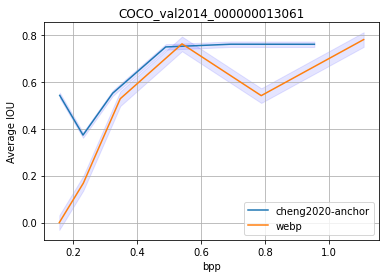

In [135]:
name = 'COCO_val2014_000000013061'
draw_curves(name)

In [4]:
def draw_boxes(name, network, quality, gt = False):
    adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
    image = Image.open(adr)
    W, H = image.size
    im_size = image.size
    
    
    file = f'/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
        
    if gt:
        image = np.array(image)
        objects = data["faster-rcnn"]["true objects"]
        bpp = 0
        #print(deform_array(objects,data["yolov5"]["cheng2020-anchor"]['6'],im_size)) 
       # print(av_iou4(objects,data["yolov5"]["webp"]['6'],im_size)) 
    else:
        objects = data["faster-rcnn"][network][quality]
        net = pretrained_models[network](quality=int(quality), pretrained=True).eval().to(device)
        image, bpp =img_compress(adr, net, quality)
        image = np.array(image)
        #bpp = round(data["yolov5"][network]["curves"][0][int(quality) - 1], 3)
    for object1 in objects:
        color = (random.randint(0,255),random.randint(0,255),random.randint(0,255))
        left = int(object1['xmin'])
        top = int(object1['ymin'])
        right = int(object1['xmax'])
        bottom = int(object1['ymax'])
        confidence = object1["confidence"]
        #print(bbox2points(bbox, W, H))
        label = object1["name"]
        cv2.rectangle(image, (left, top), (right, bottom), color, 2)
        cv2.putText(image, "{} [{:.2f}]".format(label, float(confidence)),
                    (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 2)
        
    return image, bpp

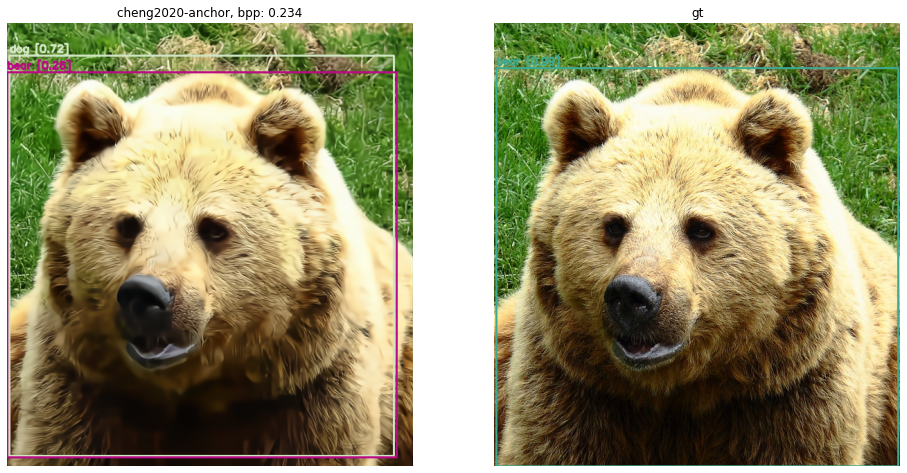

In [10]:
%matplotlib inline
fix, axes = plt.subplots(1, 2, figsize=(16, 12))
for ax in axes:
    ax.axis('off')
    
image_name = 'COCO_val2014_000000000285'
quality = '1'
    
image, bpp = draw_boxes(image_name, 'cheng2020-anchor', quality)
axes[0].imshow(image)
axes[0].title.set_text(f'cheng2020-anchor, bpp: {bpp}')

image, _ = draw_boxes(image_name, '', '', gt = True)
axes[1].imshow(image)
axes[1].title.set_text('gt')

"""image, bpp = draw_boxes(image_name, 'webp', quality)
axes[1].imshow(image)
axes[1].title.set_text(f'webp, bpp: {bpp}')

image, _ = draw_boxes(image_name, '', '', gt = True)
axes[2].imshow(image)
axes[2].title.set_text('gt')"""

#plt.savefig(f'/home/dariats/Downloads/darknet_new/curves/object change/{image_name}.png', facecolor = 'white', bbox_inches = 'tight')

plt.show()


In [45]:
name = 'COCO_val2014_000000000285'
adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
quality = '1'
net = pretrained_models['cheng2020-anchor'](quality=int(quality), pretrained=True).eval().to(device)
image, bpp =img_compress(adr, net, quality)
#image = Image.open(adr)
adr = f'/home/dariats/Downloads/darknet_new/curves/low-conf/{name}_compr.jpg'
image.save(adr)

In [16]:
files = []
values = []
dir_name = '/home/dariats/Downloads/darknet_new/img_results/val_results/'
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet_new/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    #print(file)
    value = data["yolov5"]["cheng2020-anchor"]["integrate"] -data["yolov5"]["webp"]["integrate2"]
    files.append(file)
    values.append(value)
    
indices = sorted(range(len(values)), key=lambda i: values[i])
yolov5_arr = []
for i in indices:
    if values[i]< 0:
        yolov5_arr.append(os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', files[i][-30:-4]+'jpg'))
    #print(files[i], ': ', values[i])
print(yolov5_arr)

['/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000387.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006818.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006658.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001442.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006871.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000775.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000502.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006662.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000013876.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000013832.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000011347.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val201

Object analysis

In [251]:
def iou(object_tr, obj, image_size):
    xmin = obj['xmin']
    ymin = obj['ymin']
    xmax = obj['xmax']
    ymax = obj['ymax']
    voc = (xmin, ymin, xmax, ymax)
    voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
    xmin = object_tr['xmin']
    ymin = object_tr['ymin']
    xmax = object_tr['xmax']
    ymax = object_tr['ymax']
    voc_tr = (xmin, ymin, xmax, ymax)
    voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
    iou = coco_bbox.iou(coco_bbox2)
    return iou

def find_obj(data, adr):
    image_size = (Image.open(adr).convert("RGB")).size
    true_objects = data["true objects"][:]
    ans = []
    iou_tresh = 0.5
    for quality in range(1,7):
        objects = data["cheng2020-anchor"][str(quality)][:]
        j = 0
        ans1 = []
        while j < len(objects):
            object1 = objects[j]

            """"if object1['confidence'] < conf_tresh:
                continue"""
            max_iou = 0
            i = 0
            pos_tr = 0
            max_tr_obj = {}
            for object_tr in true_objects:                                 
                iou1 = iou(object_tr, object1, image_size)
                if iou1 > max_iou:
                    pos_tr = i
                    max_iou = iou1
                    max_tr_obj = object_tr
                i+=1
            if max_tr_obj == {}:
                j+=1
                continue
            i = 0
            pos = 0
            max_iou = 0
            for obj in objects:                              
                iou1 = iou(max_tr_obj, obj, image_size)
                if iou1 > max_iou:
                    pos = i
                    max_iou = iou1
                i+= 1
            if max_iou > iou_tresh:
                if max_tr_obj["name"] != objects[pos]["name"]:
                    ans1.append([max_tr_obj["name"],objects[pos]["name"]])
            true_objects.pop(pos_tr)
            objects.pop(pos)
            if pos > j:
                j+=1
        if ans1 != []:
            ans.append([quality, ans1])
    return ans

In [252]:
arr1 = {}
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet_new/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    data = data["yolov5"]
    adr = os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', file[-30:-4]+'jpg')
    objs = find_obj(data,adr)
    if objs != []:
        arr1[adr] = objs   
print(arr1)

{'/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000139.jpg': [[1, [['person', 'refrigerator'], ['dining table', 'chair']]], [2, [['dining table', 'bottle'], ['refrigerator', 'person']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000208.jpg': [[1, [['fork', 'toothbrush']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000257.jpg': [[1, [['bus', 'truck']]], [2, [['bus', 'truck']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000285.jpg': [[1, [['bear', 'dog']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000294.jpg': [[3, [['tv', 'microwave']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000328.jpg': [[1, [['backpack', 'handbag']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000360.jpg': [[2, [['snowboard', 'person']]]], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_00

## ROI Deformation

In [ ]:
def deform_array(tr_objs, objs, image_size):
    ans = []
    for tr_obj in tr_objs:  
        xmin = tr_obj['xmin']
        ymin =tr_obj['ymin']
        xmax = tr_obj['xmax']
        ymax = tr_obj['ymax']
        voc_tr = (xmin, ymin, xmax, ymax)
        voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
        coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
        max_iou = 0
        res_obj = {}
        i = 0
        pos = 0
        for obj in objs:
            if (obj['name'] != tr_obj['name']):
                continue        
            xmin = obj['xmin']
            ymin = obj['ymin']
            xmax = obj['xmax']
            ymax = obj['ymax']
            voc = (xmin, ymin, xmax, ymax)
            voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
            coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
            iou = coco_bbox.iou(coco_bbox2)
            if iou > max_iou:
                res_obj = obj
                max_iou = iou
                pos = i
            i += 1
        if res_obj != {}:
            objs.pop(pos)
            ans_obj = {}
            print(tr_obj, res_obj)
            ans_obj["angle"], ans_obj["x_offset"], ans_obj["y_offset"], ans_obj["offset"], ans_obj["deform"] = compute_deform(tr_obj, res_obj, image_size)
            ans.append(ans_obj)
            
    return ans

In [163]:
def centre(x1, x2):
    return(x1 + (x2-x1)/2)

def area(x1, y1, x2, y2):
    return((x2-x1)*(y2-y1))
def distance(x, y):
    return math.sqrt(x*x+y*y)

def compute_deform(true_objs, objs, image_size):
    H,W = image_size
    tr_xmin = true_objs['xmin']
    tr_ymin = true_objs['ymin']
    tr_xmax = true_objs['xmax']
    tr_ymax = true_objs['ymax']
    cen_tr = (centre(tr_xmin, tr_xmax),centre(tr_ymin, tr_ymax))
    xmin = objs['xmin']
    ymin = objs['ymin']
    xmax = objs['xmax']
    ymax = objs['ymax']
    cen = (centre(xmin, xmax),centre(ymin, ymax))
    cen_offset = list(numpy.array(cen_tr) -numpy.array(cen))
    deform = (area(tr_xmin/W,tr_ymin/H,tr_xmax/W,tr_ymax/H) - area(xmin/W,ymin/H,xmax/W,ymax/H))
    ang = math.atan2(cen_offset[1]/H,cen_offset[0]/W)
    ang= math.degrees(ang)
    return ang, cen_offset[0]/W, cen_offset[1]/H, distance(cen_offset[0]/W, cen_offset[1]/H), deform

In [187]:
def iou(object_tr, obj, image_size):
    xmin = obj['xmin']
    ymin = obj['ymin']
    xmax = obj['xmax']
    ymax = obj['ymax']
    voc = (xmin, ymin, xmax, ymax)
    voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
    xmin = object_tr['xmin']
    ymin = object_tr['ymin']
    xmax = object_tr['xmax']
    ymax = object_tr['ymax']
    voc_tr = (xmin, ymin, xmax, ymax)
    voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
    iou = coco_bbox.iou(coco_bbox2)
    return iou

def deform_array(true_objects, objects, image_size):
    conf_tresh = 0.4
    iou_tresh = 0.5
    ans = []
    """while i <(len(true_objects):
        if true_objects[i]["confidence"] < conf_tresh:
            true_objects.pop(i)
        else:
            i+=1"""      
    avg_iou = 0
    iou_count = 0
    j = 0
    while j < len(objects):
        object1 = objects[j]
            
        """"if object1['confidence'] < conf_tresh:
            continue"""
        max_iou = 0
        i = 0
        pos_tr = 0
        max_tr_obj = {}
        for object_tr in true_objects:
            if (object1['name'] != object_tr['name']):
                i+= 1
                continue                                 
            iou1 = iou(object_tr, object1, image_size)
            if iou1 > max_iou:
                pos_tr = i
                max_iou = iou1
                max_tr_obj = object_tr
            i+=1
        if max_tr_obj == {}:
            j+=1
            continue
        i = 0
        pos = 0
        max_iou = 0
        for obj in objects:
            if (obj['name'] != max_tr_obj['name']):
                i+= 1
                continue                                 
            iou1 = iou(max_tr_obj, obj, image_size)
            if iou1 > max_iou:
                pos = i
                max_iou = iou1
            i+= 1

        ans_obj = {}
        ans_obj["angle"], ans_obj["x_offset"], ans_obj["y_offset"], ans_obj["offset"], ans_obj["deform"] = compute_deform(max_tr_obj , objects[pos], image_size)
        ans.append(ans_obj)
        true_objects.pop(pos_tr)
        objects.pop(pos)
        if pos > j:
            j+=1

    return ans



In [190]:
def ROI_deform(old_data, adr):
    image = Image.open(adr).convert('RGB')
    data = old_data["yolov5"]
    new_data = {}
    for key in data:
        if key == 'webp' or key == "cheng2020-anchor":
            new_data[key] = {}
            for quality in range(1, len(data[key]["curves"][0]) + 1):
                new_data[key][quality] = deform_array(data["true objects"][:], data[key][str(quality)][:],image.size)
            
    return new_data

In [191]:
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    adr = line[:-1]
    res_data = ROI_deform(data, adr)
    file = f'/home/dariats/Downloads/darknet/img_results/ROI_deformation/{line[-30:-5]}.json'
    with open(file, 'w') as outfile:
        json.dump(res_data, outfile)
    print(line[-30:-5])
f.close()

COCO_val2014_000000000042
COCO_val2014_000000000073
COCO_val2014_000000000074
COCO_val2014_000000000133
COCO_val2014_000000000136
COCO_val2014_000000000139
COCO_val2014_000000000143
COCO_val2014_000000000196
COCO_val2014_000000000208
COCO_val2014_000000000241
COCO_val2014_000000000257
COCO_val2014_000000000285
COCO_val2014_000000000294
COCO_val2014_000000000328
COCO_val2014_000000000338
COCO_val2014_000000000357
COCO_val2014_000000000359
COCO_val2014_000000000360
COCO_val2014_000000000387
COCO_val2014_000000000395
COCO_val2014_000000000400
COCO_val2014_000000000415
COCO_val2014_000000000428
COCO_val2014_000000000459
COCO_val2014_000000000472
COCO_val2014_000000000474
COCO_val2014_000000000486
COCO_val2014_000000000488
COCO_val2014_000000000502
COCO_val2014_000000000520
COCO_val2014_000000000536
COCO_val2014_000000000544
COCO_val2014_000000000564
COCO_val2014_000000000569
COCO_val2014_000000000590
COCO_val2014_000000000623
COCO_val2014_000000000626
COCO_val2014_000000000632
COCO_val2014

COCO_val2014_000000005388
COCO_val2014_000000005394
COCO_val2014_000000005412
COCO_val2014_000000005418
COCO_val2014_000000005437
COCO_val2014_000000005476
COCO_val2014_000000005477
COCO_val2014_000000005486
COCO_val2014_000000005502
COCO_val2014_000000005503
COCO_val2014_000000005513
COCO_val2014_000000005529
COCO_val2014_000000005535
COCO_val2014_000000005540
COCO_val2014_000000005569
COCO_val2014_000000005577
COCO_val2014_000000005586
COCO_val2014_000000005595
COCO_val2014_000000005599
COCO_val2014_000000005600
COCO_val2014_000000005601
COCO_val2014_000000005617
COCO_val2014_000000005635
COCO_val2014_000000005644
COCO_val2014_000000005670
COCO_val2014_000000005673
COCO_val2014_000000005690
COCO_val2014_000000005694
COCO_val2014_000000005706
COCO_val2014_000000005713
COCO_val2014_000000005724
COCO_val2014_000000005728
COCO_val2014_000000005754
COCO_val2014_000000005758
COCO_val2014_000000005802
COCO_val2014_000000005816
COCO_val2014_000000005820
COCO_val2014_000000005860
COCO_val2014

COCO_val2014_000000010432
COCO_val2014_000000010442
COCO_val2014_000000010449
COCO_val2014_000000010496
COCO_val2014_000000010526
COCO_val2014_000000010534
COCO_val2014_000000010580
COCO_val2014_000000010583
COCO_val2014_000000010591
COCO_val2014_000000010615
COCO_val2014_000000010643
COCO_val2014_000000010644
COCO_val2014_000000010678
COCO_val2014_000000010681
COCO_val2014_000000010684
COCO_val2014_000000010693
COCO_val2014_000000010694
COCO_val2014_000000010698
COCO_val2014_000000010705
COCO_val2014_000000010707
COCO_val2014_000000010720
COCO_val2014_000000010766
COCO_val2014_000000010785
COCO_val2014_000000010793
COCO_val2014_000000010800
COCO_val2014_000000010822
COCO_val2014_000000010825
COCO_val2014_000000010837
COCO_val2014_000000010844
COCO_val2014_000000010858
COCO_val2014_000000010920
COCO_val2014_000000010935
COCO_val2014_000000010954
COCO_val2014_000000010966
COCO_val2014_000000010977
COCO_val2014_000000010986
COCO_val2014_000000010995
COCO_val2014_000000011034
COCO_val2014

COCO_val2014_000000015827
COCO_val2014_000000015839
COCO_val2014_000000015846
COCO_val2014_000000015850
COCO_val2014_000000015862
COCO_val2014_000000015908
COCO_val2014_000000015918
COCO_val2014_000000015947
COCO_val2014_000000015954
COCO_val2014_000000015978
COCO_val2014_000000015984
COCO_val2014_000000015994
COCO_val2014_000000016005
COCO_val2014_000000016010
COCO_val2014_000000016025
COCO_val2014_000000016046
COCO_val2014_000000016064
COCO_val2014_000000016098


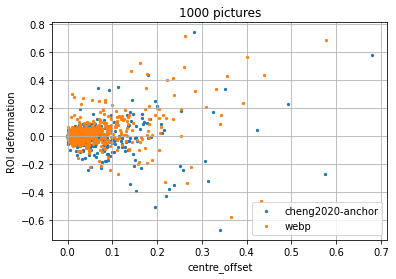

['/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000623.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001404.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001503.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002212.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002477.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000004108.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000004229.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000004509.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000004980.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000005816.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006484.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val201

In [9]:
high_deform_arr = []
codec = 'cheng2020-anchor'
codec1 = 'webp'
quality = '1'
x = []
y = []
x1 = []
y1 = []
x2 = []
y2 = []
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/ROI_deformation/{line[-30:-5]}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    #cheng    
    for obj in data[codec][quality]:
        if abs(obj["deform"]) >0.1 and obj["offset"] > 0.1:
            high_deform_arr.append(os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', file[-30:-4]+'jpg'))
        """if line[:-1] in yolov5_arr:
            x2.append(obj["offset"])
            y2.append(obj["deform"])
        else:"""
        x.append(obj["offset"])
        y.append(obj["deform"])
    #webp
    for obj in data[codec1][quality]:
        x1.append(obj["offset"])
        y1.append(obj["deform"])
plt.scatter(x,y , label = codec, s = 5)
plt.scatter(x1,y1 , label = codec1, s = 5)
#plt.scatter(x2,y2 , label = 'low cheng', s = 30)
plt.xlabel('centre_offset')
plt.ylabel('ROI deformation')
#plt.title(name)
plt.title('1000 pictures')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/ROI_qual{quality}.png', facecolor = 'white')
plt.show()
print(high_deform_arr)

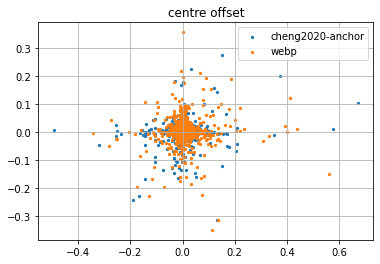

In [10]:
codec = 'cheng2020-anchor'
codec1 = 'webp'
quality = '1'
x = []
y = []
x1 = []
y1 = []
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/ROI_deformation/{line[-30:-5]}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
        
    for obj in data[codec][quality]:
        x.append(obj["x_offset"])
        y.append(obj["y_offset"])

    for obj in data[codec1][quality]:
        x1.append(obj["x_offset"])
        y1.append(obj["y_offset"])
plt.scatter(x,y , label = codec, s = 5)
plt.scatter(x1,y1 , label = codec1, s = 5)
#plt.scatter(x2,y2 , label = 'low cheng', s = 10)
#plt.title(name)
plt.title('centre offset')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/centre_offset_qual{quality}.png', facecolor = 'white')
plt.show()

In [206]:
codec = 'cheng2020-anchor'
codec1 = 'webp'
quality = '6'
x = []
y = []
x1 = []
y1 = []
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/ROI_deformation/{line[-30:-5]}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    for obj in data[codec][quality]:
        if obj["offset"] < 0.02 and abs(obj["deform"]) < 0.02:
            x.append(obj["offset"])
            y.append(obj["deform"])

    for obj in data[codec1][quality]:
        if obj["offset"] < 0.02 and abs(obj["deform"]) < 0.02:
            x1.append(obj["offset"])
            y1.append(obj["deform"])
        


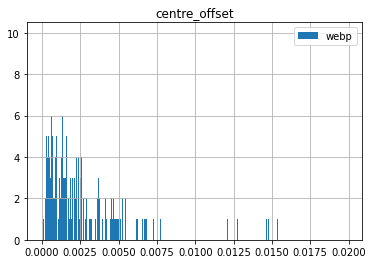

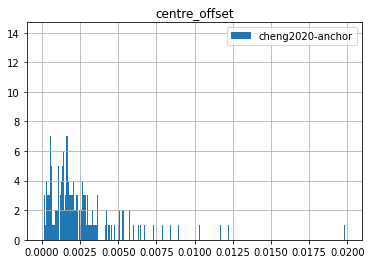

In [212]:
#plt.hist(y, bins = 100, label = codec)
plt.hist(x1, 10000, label = codec1)
#plt.title(name)
plt.title('centre_offset')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/hist_webp.png', facecolor = 'white')
plt.show()
plt.hist(x, 10000, label = codec)
plt.title('centre_offset')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/hist_cheng.png', facecolor = 'white')
plt.show()

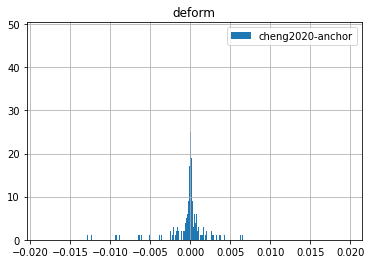

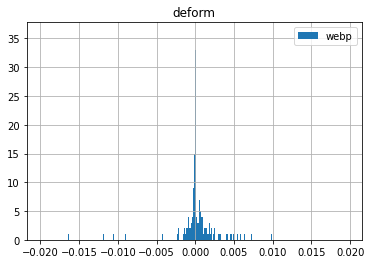

In [211]:
plt.hist(y, bins = 10000, label = codec)
plt.title('deform')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/hist_deform_cheng.png', facecolor = 'white')
plt.show()
plt.hist(y1, bins = 10000, label = codec1)
plt.title('deform')
plt.legend()
plt.grid()
#plt.savefig(f'/home/dariats/Downloads/darknet/curves/high-roi-deform/hist_deform_webp.png', facecolor = 'white')
plt.show()

## Faster R-CNN

In [4]:
from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_Weights
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT, pretrained = True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [6]:
with open('/home/dariats/Downloads/darknet/coco/annotations/instances_train2014.json', 'r') as true_file:
    true_data = json.load(true_file)

In [74]:
print(true_data['categories'])

[{'supercategory': 'person', 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'}, {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'}, {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'}, {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'}, {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'}, {'supercategory': 'animal', 'id': 16, 'name': 'bird'}, {'supercategory': 'animal', 'id': 17, 'name': 'cat'}, {'supercategory': 'animal', 'id': 18, 'name': 'dog'}, {'supercategory

In [90]:
def net_res_fr(original_img):
    data_transform = transforms.Compose([transforms.ToTensor()])
    img = data_transform(original_img)
    img = torch.unsqueeze(img, dim=0)
    with torch.no_grad():
        predictions = model(img)[0]
        predict_boxes = predictions["boxes"].to("cpu").numpy()
        predict_classes = predictions["labels"].to("cpu").numpy()
        predict_scores = predictions["scores"].to("cpu").numpy()
    i = 0
    data = []
    for conf in predict_scores:
        if conf >= 0.25:
            obj = {}
            obj['xmin'] = predict_boxes[i][0]
            obj['xmax'] = predict_boxes[i][2]
            obj['ymin'] = predict_boxes[i][1]
            obj['ymax'] = predict_boxes[i][3]
            obj['confidence'] = conf
            obj['class'] = predict_classes[i]
            obj['name'] = next(x['name'] for x in true_data['categories'] if x['id'] == predict_classes[i])

            i += 1
            data.append(obj)
    return data

In [103]:
import timeit

In [104]:
name = 'COCO_val2014_000000000486'
original_img = Image.open(f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg').convert('RGB')
print(timeit.timeit())
print(net_res_fr(original_img))
print(timeit.timeit())

0.006006209005136043
[{'xmin': 623.0161, 'xmax': 639.48566, 'ymin': 232.7634, 'ymax': 268.53006, 'confidence': 0.9611681, 'class': 44, 'name': 'bottle'}, {'xmin': 250.98564, 'xmax': 387.84793, 'ymin': 306.252, 'ymax': 385.45886, 'confidence': 0.943428, 'class': 51, 'name': 'bowl'}, {'xmin': 394.30078, 'xmax': 455.60648, 'ymin': 177.29799, 'ymax': 291.61462, 'confidence': 0.8719029, 'class': 82, 'name': 'refrigerator'}, {'xmin': 235.31567, 'xmax': 238.94803, 'ymin': 200.79219, 'ymax': 217.26596, 'confidence': 0.8044702, 'class': 49, 'name': 'knife'}, {'xmin': 481.99533, 'xmax': 508.5119, 'ymin': 65.4333, 'ymax': 110.93997, 'confidence': 0.75093704, 'class': 47, 'name': 'cup'}, {'xmin': 499.10733, 'xmax': 520.85754, 'ymin': 278.2642, 'ymax': 302.70285, 'confidence': 0.7495399, 'class': 44, 'name': 'bottle'}, {'xmin': 138.18018, 'xmax': 147.1275, 'ymin': 194.83806, 'ymax': 203.51181, 'confidence': 0.70921725, 'class': 85, 'name': 'clock'}, {'xmin': 235.5933, 'xmax': 270.3328, 'ymin': 354.

In [84]:
name = 'COCO_val2014_000000000486'
original_img = Image.open(f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg').convert('RGB')

data_transform = transforms.Compose([transforms.ToTensor()])
img = data_transform(original_img)
img = torch.unsqueeze(img, dim=0)
with torch.no_grad():
    predictions = model(img)[0]
    predict_boxes = predictions["boxes"].to("cpu").numpy()
    predict_classes = predictions["labels"].to("cpu").numpy()
    predict_scores = predictions["scores"].to("cpu").numpy()


In [85]:
i = 0
data = []
for conf in predict_scores:
    if conf >= 0.25:
        obj = {}
        obj['xmin'] = predict_boxes[i][0]
        obj['xmax'] = predict_boxes[i][2]
        obj['ymin'] = predict_boxes[i][1]
        obj['ymax'] = predict_boxes[i][3]
        obj['confidence'] = conf
        obj['class'] = predict_classes[i]
        obj['name'] = next(x['name'] for x in true_data['categories'] if x['id'] == predict_classes[i])
        
        i += 1
        data.append(obj)
print(data)

[{'xmin': 623.0161, 'xmax': 639.48566, 'ymin': 232.7634, 'ymax': 268.53006, 'confidence': 0.9611681, 'class': 44, 'name': 'bottle'}, {'xmin': 250.98564, 'xmax': 387.84793, 'ymin': 306.252, 'ymax': 385.45886, 'confidence': 0.943428, 'class': 51, 'name': 'bowl'}, {'xmin': 394.30078, 'xmax': 455.60648, 'ymin': 177.29799, 'ymax': 291.61462, 'confidence': 0.8719029, 'class': 82, 'name': 'refrigerator'}, {'xmin': 235.31567, 'xmax': 238.94803, 'ymin': 200.79219, 'ymax': 217.26596, 'confidence': 0.8044702, 'class': 49, 'name': 'knife'}, {'xmin': 481.99533, 'xmax': 508.5119, 'ymin': 65.4333, 'ymax': 110.93997, 'confidence': 0.75093704, 'class': 47, 'name': 'cup'}, {'xmin': 499.10733, 'xmax': 520.85754, 'ymin': 278.2642, 'ymax': 302.70285, 'confidence': 0.7495399, 'class': 44, 'name': 'bottle'}, {'xmin': 138.18018, 'xmax': 147.1275, 'ymin': 194.83806, 'ymax': 203.51181, 'confidence': 0.70921725, 'class': 85, 'name': 'clock'}, {'xmin': 235.5933, 'xmax': 270.3328, 'ymin': 354.53162, 'ymax': 368.64

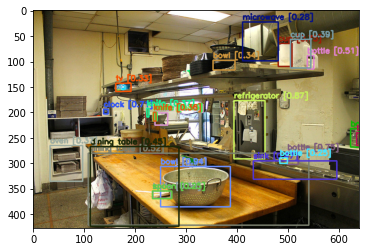

In [86]:
adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
image = Image.open(adr)
image = np.array(image)
for object1 in data:
    color = (random.randint(0,255),random.randint(0,255),random.randint(0,255))
    left = int(object1['xmin'])
    top = int(object1['ymin'])
    right = int(object1['xmax'])
    bottom = int(object1['ymax'])
    confidence = object1["confidence"]
    #print(bbox2points(bbox, W, H))
    label = object1["name"]
    cv2.rectangle(image, (left, top), (right, bottom), color, 2)
    cv2.putText(image, "{} [{:.2f}]".format(label, float(confidence)),
                    (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 2)
plt.imshow(image)

In [62]:
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
arr = []
for line in f:
    image = Image.open(line[:-1])
    file = f'/home/dariats/Downloads/darknet_new/img_results/val_results/{line[-30:-5]}.json'
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    for key in data:
        if key == "yolov5":
            for codec in data[key]:
                if codec != 'curves' and codec != 'integrate' and codec != 'true objects':
                    for quality in range(1, 7):
                        for obj in data[key][codec][str(quality)]:
                            arr.append(obj["confidence"])
    
    
print(min(arr))

0.2500006854534149


In [7]:
import math
import io
import torch
from torchvision import transforms
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pybboxes as pbx
import json
from pybboxes import BoundingBox
from sklearn.metrics import average_precision_score
import numpy
import matplotlib.pyplot as plt
import os
from scipy import integrate
from numpy import trapz
import random
import cv2

device = 'cuda' if torch.cuda.is_available() else 'cpu'
def compute_bpp(out_net):
    size = out_net['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    return sum(torch.log(likelihoods).sum() / (-math.log(2) * num_pixels)
              for likelihoods in out_net['likelihoods'].values()).item()
       
import torch.nn.functional as F
def pad(x, p=2**6):
    h, w = x.size(2), x.size(3)
    H = (h + p - 1) // p * p
    W = (w + p - 1) // p * p
    padding_left = (W - w) // 2
    padding_right = W - w - padding_left
    padding_top = (H - h) // 2
    padding_bottom = H - h - padding_top
    return padding_left, padding_bottom, F.pad(
        x,
        (padding_left, padding_right, padding_top, padding_bottom),
        mode="constant",
        value=0,
    )
    
    
def pillow_encode(img, fmt='jpeg', quality=10):
    tmp = io.BytesIO()
    img.save(tmp, format=fmt, quality=quality)
    tmp.seek(0)
    filesize = tmp.getbuffer().nbytes
    bpp = filesize * float(8) / (img.size[0] * img.size[1])
    rec = Image.open(tmp).convert("RGB")
    return rec, bpp

def find_closest_bpp(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    for i in range(10):
        mid = (upper - lower) / 2 + lower
        if int(mid) == int(prev_mid):
            break
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        if bpp > target:
            upper = mid - 1
        else:
            lower = mid
    return rec, bpp
    
#os.system("pip install -r https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt")


from compressai.zoo import models as pretrained_models
from torchvision.models.detection.faster_rcnn import FasterRCNN_ResNet50_FPN_Weights
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT, pretrained = True)
model.eval()

def net_res_fr(original_img):
    data_transform = transforms.Compose([transforms.ToTensor()])
    img = data_transform(original_img)
    img = torch.unsqueeze(img, dim=0)
    with torch.no_grad():
        predictions = model(img)[0]
        predict_boxes = predictions["boxes"].to("cpu").numpy()
        predict_classes = predictions["labels"].to("cpu").numpy()
        predict_scores = predictions["scores"].to("cpu").numpy()
    i = 0
    data = []
    for conf in predict_scores:
        if conf >= 0.25:
            obj = {}
            obj['xmin'] = predict_boxes[i][0].item()
            obj['xmax'] = predict_boxes[i][2].item()
            obj['ymin'] = predict_boxes[i][1].item()
            obj['ymax'] = predict_boxes[i][3].item()
            obj['confidence'] = conf.item()
            obj['class'] = predict_classes[i].item()
            obj['name'] = next(x['name'] for x in true_data['categories'] if x['id'] == predict_classes[i])

            i += 1
            data.append(obj)
    return data

def img_compress(adr, net, quality):
    img = Image.open(adr).convert('RGB')
    h, w = img.size
    #x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
    with torch.no_grad():
        out_net = net.forward(x)
    out_net['x_hat'].clamp_(0, 1) 
    rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
    l = len(adr)
    #change path if need to store compressed pictures
    #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
    #rec_net = rec_net.save(str1)
    bpp = round(compute_bpp(out_net), 3)
    return rec_net, bpp
  
def iou(object_tr, obj, image_size):
    xmin = obj['xmin']
    ymin = obj['ymin']
    xmax = obj['xmax']
    ymax = obj['ymax']
    voc = (xmin, ymin, xmax, ymax)
    voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
    xmin = object_tr['xmin']
    ymin = object_tr['ymin']
    xmax = object_tr['xmax']
    ymax = object_tr['ymax']
    voc_tr = (xmin, ymin, xmax, ymax)
    voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
    iou = coco_bbox.iou(coco_bbox2)
    return iou

def av_iou(true_objects, objects, image_size):
    conf_tresh = 0.4
    iou_tresh = 0.5
    """while i <(len(true_objects):
        if true_objects[i]["confidence"] < conf_tresh:
            true_objects.pop(i)
        else:
            i+=1"""      
    avg_iou = 0
    iou_count = 0
    j = 0
    while j < len(objects):
        object1 = objects[j]
            
        """"if object1['confidence'] < conf_tresh:
            continue"""
        max_iou = 0
        i = 0
        pos_tr = 0
        max_tr_obj = {}
        for object_tr in true_objects:
            if (object1['name'] != object_tr['name']):
                i+= 1
                continue                                 
            iou1 = iou(object_tr, object1, image_size)
            if iou1 > max_iou:
                pos_tr = i
                max_iou = iou1
                max_tr_obj = object_tr
            i+=1
        if max_tr_obj == {}:
            j+=1
            continue
        i = 0
        pos = 0
        max_iou = 0
        for obj in objects:
            if (obj['name'] != max_tr_obj['name']):
                i+= 1
                continue                                 
            iou1 = iou(max_tr_obj, obj, image_size)
            if iou1 > max_iou:
                pos = i
                max_iou = iou1
            i+= 1
        
        #print(objects[pos], true_objects[pos_tr])
        
        
        true_objects.pop(pos_tr)
        objects.pop(pos)
        if pos > j:
            j+=1
        if (max_iou > iou_tresh):
            avg_iou+=max_iou
            iou_count+=1

    if (iou_count+len(true_objects) > 0):   
        avg_iou = avg_iou/(iou_count+len(true_objects))
    return avg_iou

    
def compute( adr, model):
    
    names = ['cheng2020-anchor']
    qual = {'cheng2020-anchor':7}
    data = {}
    ##predictions on uncompressed
    data["true objects"] = {}
    image = Image.open(adr).convert('RGB')
    tr_results = net_res_fr(image)
    data["true objects"] = tr_results
    for name in names:
        bpps = []
        ious = []
        data[name] = {}
        for quality in range(1,4):
            data[name][quality] = {}
            net = pretrained_models[name](quality=quality, pretrained=True).eval().to(device)
            image, bpp =img_compress(adr, net, quality)
            bpps.append(bpp)
            results = net_res_fr(image)
            data[name][quality]  =results
            iou = av_iou(tr_results[:], results[:], image.size)
            ious.append(iou)
        data[name]["curves"] = {}
        data[name]["curves"] = [bpps, ious]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[name]["integrate"] = integrate.trapz(ious, bpps)/x

    old_data = {}
    old_data["faster-rcnn"]=data  
    return old_data
    
#path to file with image adresses    
f = open('/home/dariats/Downloads/darknet/coco/done.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/{line[-30:-5]}.json'
    adr = line[:-1]
    data = compute(adr, model)
    #path to result folder
    
    print(file)
    #print(data)
    with open(file, 'w') as outfile:
        json.dump(data, outfile)
        
f.close()

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016161.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016164.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016180.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016193.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016237.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016238.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016249.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016285.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016308.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016318.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000016356.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017741.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017756.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017769.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017776.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017778.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017859.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017867.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017869.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017882.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017899.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000017905.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019079.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019087.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019090.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019102.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019109.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019132.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019142.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019157.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019158.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019167.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000019221.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020459.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020465.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020470.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020481.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020485.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020487.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020536.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020541.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020570.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020571.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000020598.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021919.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021924.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021971.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021979.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021989.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021993.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000021994.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000022004.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000022051.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000022072.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000022085.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023200.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023201.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023230.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023247.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023251.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023272.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023294.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023320.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023351.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023359.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000023369.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024805.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024845.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024851.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024869.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024880.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024919.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024921.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024931.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024958.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000024996.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000025005.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026226.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026323.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026348.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026363.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026371.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026374.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026378.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026386.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026393.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026398.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000026413.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027611.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027617.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027642.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027648.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027656.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027658.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027662.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027696.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027717.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027731.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000027755.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029080.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029094.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029125.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029136.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029138.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029151.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029160.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029187.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029197.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029224.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000029252.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030611.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030645.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030657.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030667.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030675.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030685.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030706.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030707.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030719.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030785.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000030796.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031971.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031980.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031981.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031983.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031984.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000031993.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000032001.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000032038.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000032039.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000032054.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000032056.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033377.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033405.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033441.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033489.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033532.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033576.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033626.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033638.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033645.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033647.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000033650.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034786.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034808.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034811.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034818.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034820.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034826.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034830.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034847.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034866.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034869.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000034873.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036196.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036226.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036230.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036238.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036277.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036311.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036331.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036333.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036349.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036361.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000036409.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037751.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037777.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037783.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037814.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037871.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037875.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037882.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037900.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037945.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000037958.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000038029.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039390.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039399.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039405.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039420.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039430.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039468.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039472.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039477.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039484.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039499.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000039502.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040881.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040894.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040896.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040924.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040926.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040937.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040946.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040948.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040986.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040989.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000040998.json

/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042482.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042499.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042501.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042507.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042526.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042528.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042534.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042541.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042551.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042563.json
/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/COCO_val2014_000000042568.json

low confidence 

In [12]:
def iou(object_tr, obj, image_size):
    xmin = obj['xmin']
    ymin = obj['ymin']
    xmax = obj['xmax']
    ymax = obj['ymax']
    voc = (xmin, ymin, xmax, ymax)
    voc_bbox = pbx.convert_bbox(voc, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox = BoundingBox.from_coco(*voc_bbox, image_size=image_size, strict = False)
    xmin = object_tr['xmin']
    ymin = object_tr['ymin']
    xmax = object_tr['xmax']
    ymax = object_tr['ymax']
    voc_tr = (xmin, ymin, xmax, ymax)
    voc_bbox_tr = pbx.convert_bbox(voc_tr, from_type="voc", to_type="coco", image_size=image_size, strict = False)
    coco_bbox2 = BoundingBox.from_coco(*voc_bbox_tr, image_size=image_size, strict = False)
    iou = coco_bbox.iou(coco_bbox2)
    return iou

def find_obj_conf(data, adr):
    image_size = (Image.open(adr).convert("RGB")).size
    true_objects = data["true objects"][:]
    ans = []
    iou_tresh = 0.5
    d_tresh = 0.7
    for quality in range(1,4):
        objects = data["cheng2020-anchor"][str(quality)][:]
        j = 0
        ans1 = {}
        ans1[quality] = []
        while j < len(objects):
            object1 = objects[j]

            """"if object1['confidence'] < conf_tresh:
                continue"""
            max_iou = 0
            i = 0
            pos_tr = 0
            max_tr_obj = {}
            for object_tr in true_objects:                                 
                iou1 = iou(object_tr, object1, image_size)
                if iou1 > max_iou:
                    pos_tr = i
                    max_iou = iou1
                    max_tr_obj = object_tr
                i+=1
            if max_tr_obj == {}:
                j+=1
                continue
            i = 0
            pos = 0
            max_iou = 0
            for obj in objects:                              
                iou1 = iou(max_tr_obj, obj, image_size)
                if iou1 > max_iou:
                    pos = i
                    max_iou = iou1
                i+= 1
            if max_iou > iou_tresh:
                if max_tr_obj["confidence"] - objects[pos]["confidence"] > d_tresh:
                    ans1[quality].append([max_tr_obj["name"],  objects[pos]["confidence"], max_tr_obj["confidence"]])
            true_objects.pop(pos_tr)
            objects.pop(pos)
            if pos > j:
                j+=1
        if ans1[quality] != []:
            ans.append(ans1)
    return ans

In [13]:
arr1 = {}
f = open('/home/dariats/Downloads/darknet/coco/done.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet_new/img_results/faster-rcnn/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    data = data["faster-rcnn"]
    adr = os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', line[-30:-4]+'jpg')
    objs = find_obj_conf(data,adr)
    if objs != []:
        arr1[adr] = objs   
print(arr1)

{'/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000016606.jpg': [{1: [['mouse', 0.2556750178337097, 0.9851198792457581]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000016761.jpg': [{1: [['dog', 0.2525169253349304, 0.9962305426597595]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018837.jpg': [{1: [['person', 0.26632460951805115, 0.9873548150062561]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018896.jpg': [{1: [['elephant', 0.28360670804977417, 0.9920226335525513]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018928.jpg': [{1: [['donut', 0.2612292766571045, 0.9777050018310547]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000019441.jpg': [{1: [['bottle', 0.26044222712516785, 0.9838945269584656]]}], '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000020777.jpg': [{2: [['truck', 0.25603264570236206, 0

In [14]:
print(len(arr1))

50


/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000016606.jpg
{1: [['mouse', 0.2556750178337097, 0.9851198792457581]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000016761.jpg
{1: [['dog', 0.2525169253349304, 0.9962305426597595]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018837.jpg
{1: [['person', 0.26632460951805115, 0.9873548150062561]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018896.jpg
{1: [['elephant', 0.28360670804977417, 0.9920226335525513]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000018928.jpg
{1: [['donut', 0.2612292766571045, 0.9777050018310547]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000019441.jpg
{1: [['bottle', 0.26044222712516785, 0.9838945269584656]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000020777.jpg
{2: [['truck', 0.25603264570236206, 0.9759684801101685]]}
2
/home/

/tmp/ipykernel_45566/4235691062.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fix, axes = plt.subplots(1, 3, figsize=(16, 8))


/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000027756.jpg
{1: [['car', 0.260132372379303, 0.9885979890823364]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000027917.jpg
{1: [['car', 0.28438660502433777, 0.9870589971542358]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000028343.jpg
{1: [['cup', 0.2645304799079895, 0.9890284538269043]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000028738.jpg
{1: [['cow', 0.2782920002937317, 0.9997575879096985]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000029094.jpg
{1: [['sheep', 0.25342848896980286, 0.9766809344291687]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000029138.jpg
{1: [['skis', 0.2632808983325958, 0.9711479544639587]]}
1
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000029346.jpg
{1: [['cake', 0.26659470796585083, 0.9708260893821716]]}
1
/home/dariats/Downloa

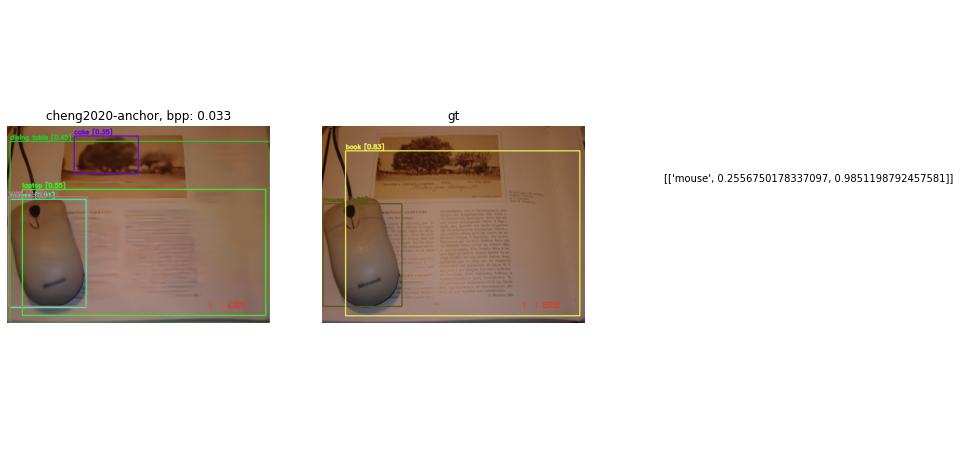

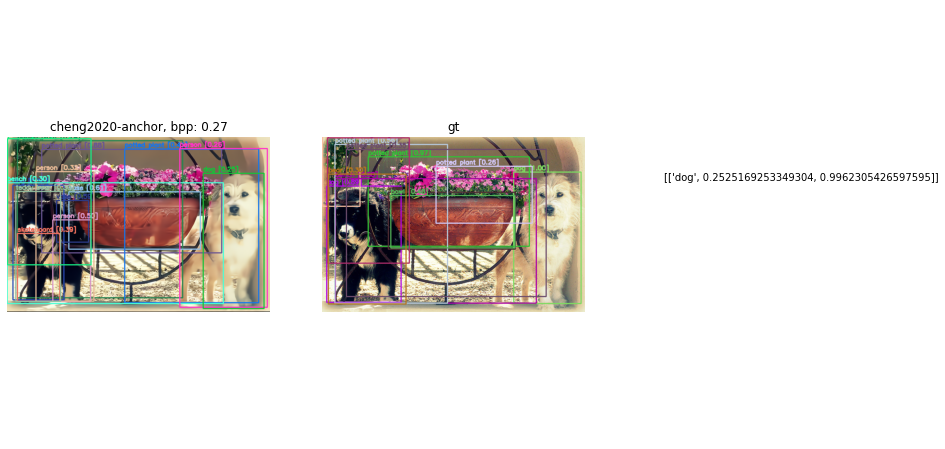

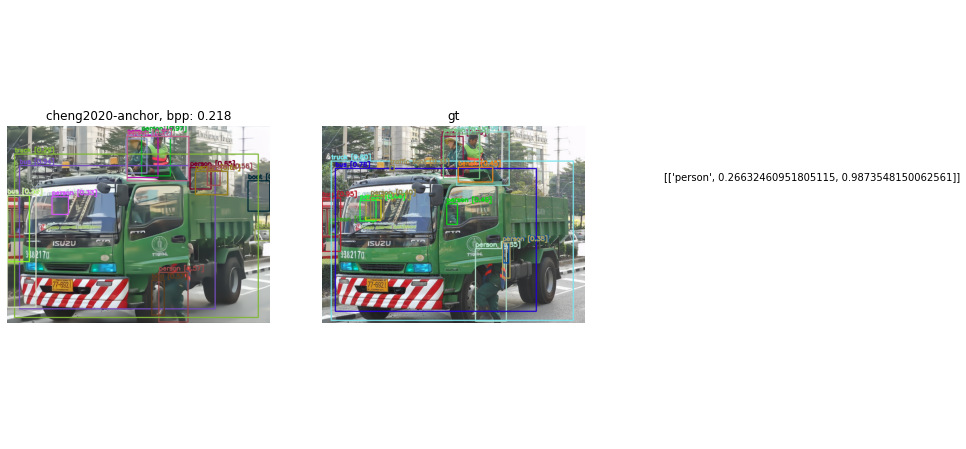

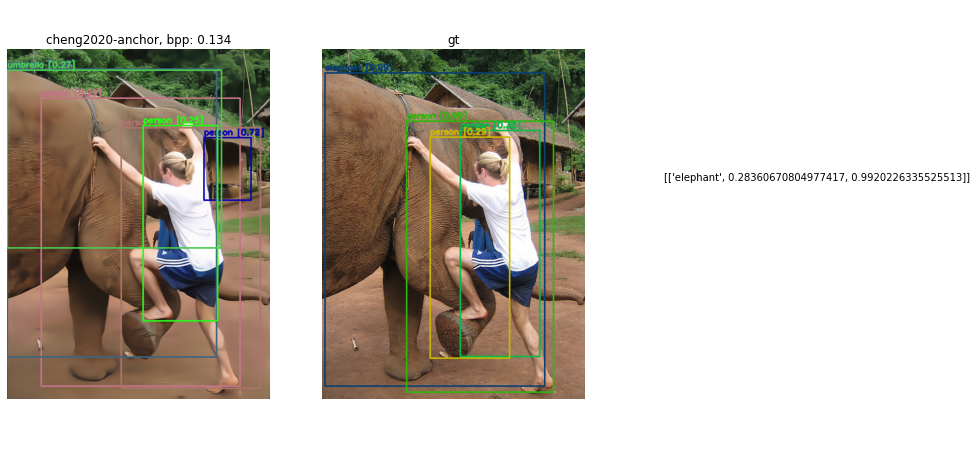

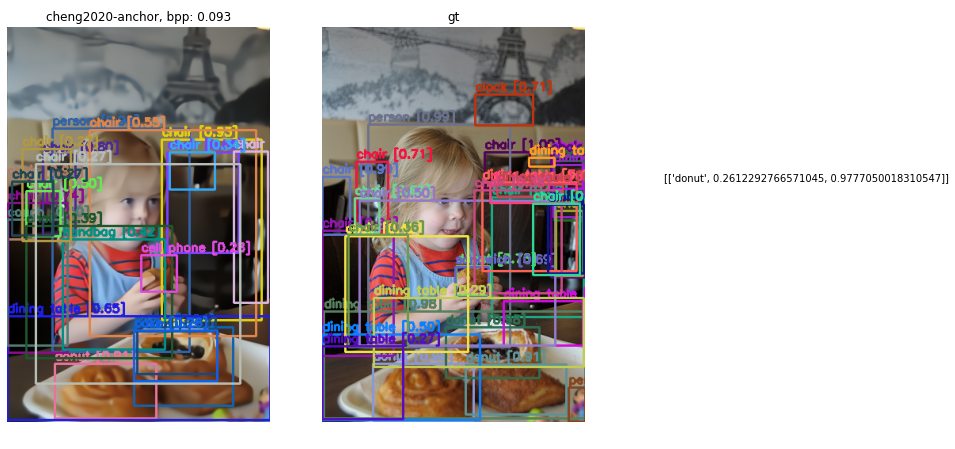

...

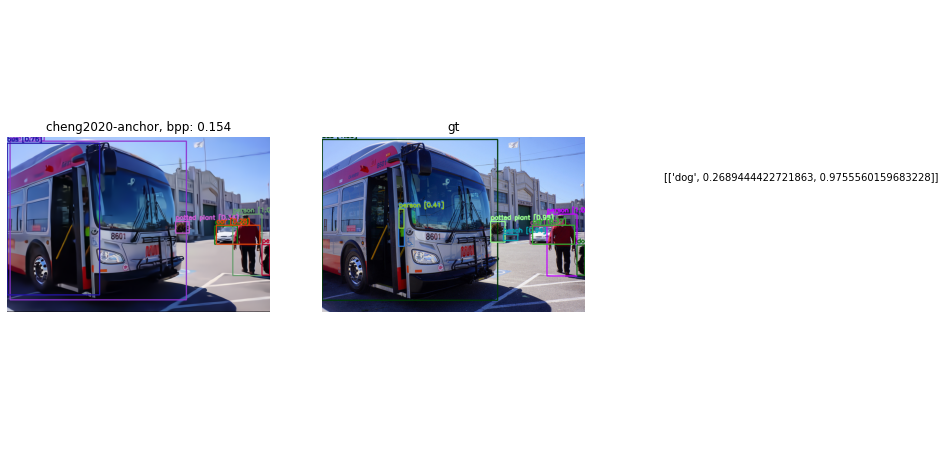

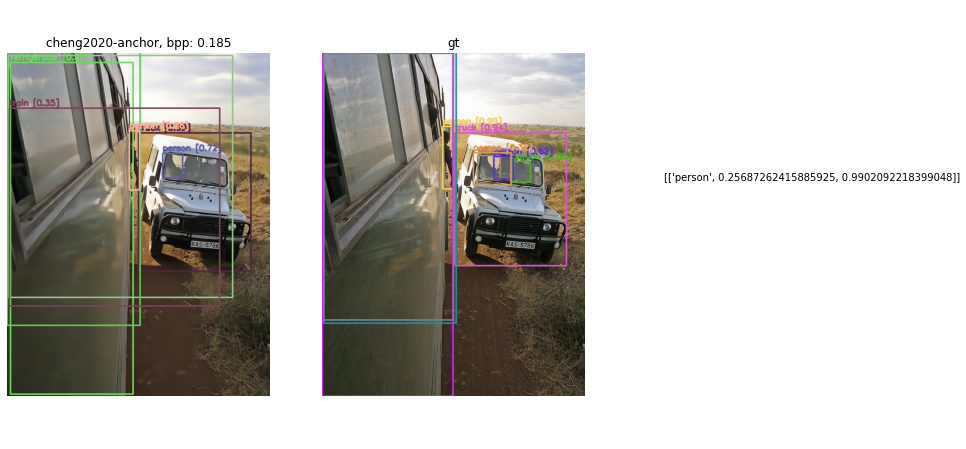

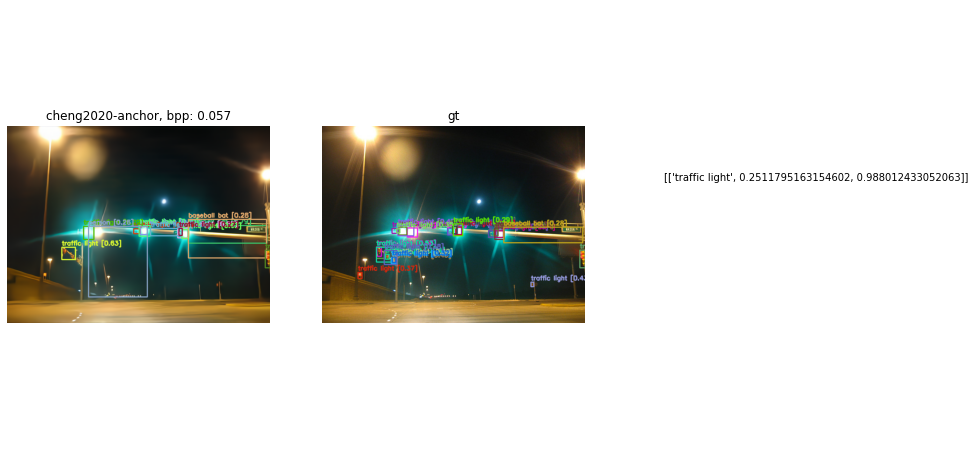

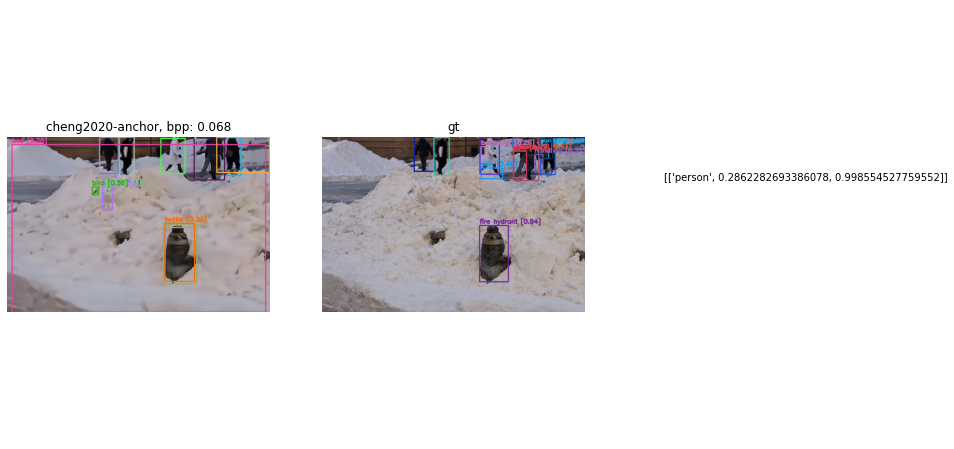

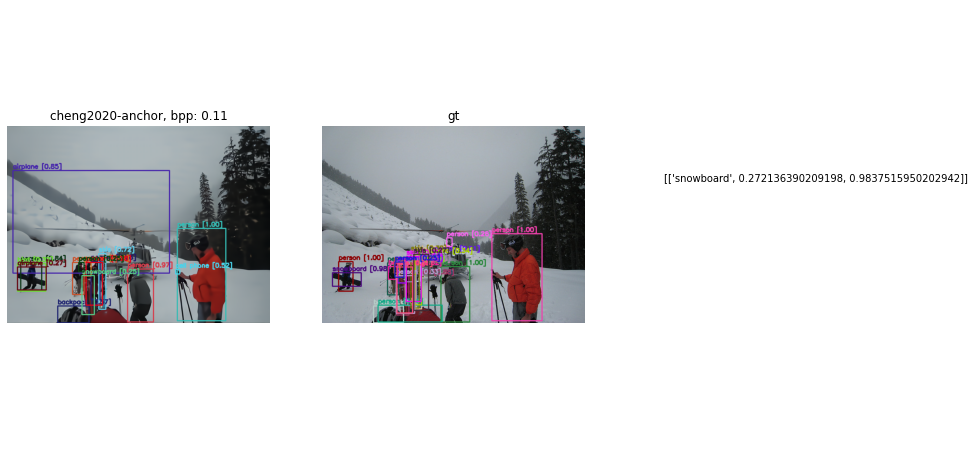

In [17]:
%matplotlib inline

for key in arr1:
    fix, axes = plt.subplots(1, 3, figsize=(16, 8))
    for ax in axes:
        ax.axis('off')
    adr = key
    print(adr)
    image_name = adr[-29:-4]
    print(arr1[key][0])
    for quality in arr1[key][0].keys():
        print(quality)
        image, bpp = draw_boxes(image_name, 'cheng2020-anchor', str(quality))
        axes[0].imshow(image)
        axes[0].title.set_text(f'cheng2020-anchor, bpp: {bpp}')

        image, _ = draw_boxes(image_name, '', '', gt = True)
        axes[1].imshow(image)
        axes[1].title.set_text('gt')


        axes[2].text(0.1,0.6,arr1[f'/home/dariats/Downloads/darknet/coco/images/val2014/{image_name}.jpg'][0][int(quality)])
        net = pretrained_models['cheng2020-anchor'](quality=int(quality), pretrained=True).eval().to(device)
        image, bpp =img_compress(adr, net, quality)
        image1 = Image.open(adr)
        adr = f'/home/dariats/Downloads/darknet_new/curves/low-conf/{image_name}_compr.png'
        adr1 = f'/home/dariats/Downloads/darknet_new/curves/low-conf/{image_name}.png'
        image.save(adr)
        image1.save(adr1)
        plt.savefig(f'/home/dariats/Downloads/darknet_new/curves/low-conf/bboxes/{image_name}.png', facecolor = 'white', bbox_inches = 'tight')

#plt.show()


In [66]:
name = 'COCO_val2014_000000003145'
adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
quality = '1'
net = pretrained_models['cheng2020-anchor'](quality=int(quality), pretrained=True).eval().to(device)
image, bpp =img_compress(adr, net, quality)
image1 = Image.open(adr)
adr = f'/home/dariats/Downloads/darknet_new/curves/low-conf/{name}_compr.jpg'
adr1 = f'/home/dariats/Downloads/darknet_new/curves/low-conf/{name}.jpg'
image.save(adr)
image1.save(adr1)

## DeepLabv3

In [25]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

Using cache found in /home/dariats/.cache/torch/hub/pytorch_vision_v0.10.0
/home/dariats/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/dariats/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [282]:
input_image = Image.open('/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000486.jpg').convert('RGB')
print(input_image.size)
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
#print(input_batch.size)
with torch.no_grad():
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)
#print(torch.sum(output_predictions))

(640, 427)
<built-in method size of Tensor object at 0xffff0db4f220>
tensor(0)


In [241]:
output_predictions[output_predictions != 15] = 0
output_predictions[output_predictions == 15] = 1

In [226]:
import copy

In [274]:
adr = '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000073.jpg'
net = pretrained_models['cheng2020-anchor'](quality=1, pretrained=True).eval().to(device)
image, bpp =img_compress(adr, net, 1)
results = net_res(image)
print(av_iou(output2.argmax(0), results.argmax(0)))

0.46562105417251587
0.46562105417251587


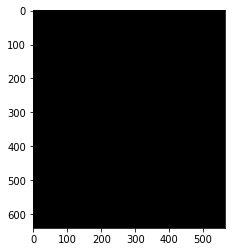

In [244]:
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
r.putpalette(colors)

import matplotlib.pyplot as plt
plt.imshow(r)


In [11]:
def img_compress(adr, net, quality):
    img = Image.open(adr).convert('RGB')
    h, w = img.size
    #x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
    with torch.no_grad():
        out_net = net.forward(x)
    out_net['x_hat'].clamp_(0, 1) 
    rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
    l = len(adr)
    #change path if need to store compressed pictures
    #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
    #rec_net = rec_net.save(str1)
    bpp = round(compute_bpp(out_net), 3)
    return rec_net, bpp

def net_res(input_image):
    preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
    with torch.no_grad():
        output = model(input_batch)['out'][0]
    return output

def av_iou(tr_tensor, tensor):
    summ = 0
    amount = 0
    for i in range(1, 21):
        iou = 0
        temp_tr_tensor = copy.deepcopy(tr_tensor)
        temp_tensor = tensor
        temp_tr_tensor[temp_tr_tensor != i] = 0
        temp_tr_tensor[temp_tr_tensor == i] = 1
        
        if torch.sum(temp_tr_tensor) != 0:
            amount+=1
            temp_tensor[temp_tensor != i] = 0
            temp_tensor[temp_tensor == i] = 1
            ten_and = (torch.logical_and(temp_tr_tensor, temp_tensor)).long()
            ten_or = (torch.logical_or(temp_tr_tensor, temp_tensor)).long()
            iou = torch.sum(ten_and)/torch.sum(ten_or)
            summ +=iou
    if amount != 0:
        summ = summ/amount
    return summ.item()

In [18]:
files = []
values = []
dir_name = '/home/dariats/Downloads/darknet/img_results/val_results/'
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    value = data["deeplabv3"]["cheng2020-anchor"]["integrate"] -data["deeplabv3"]["webp"]["integrate2"]
    files.append(file)
    values.append(value)

indices = sorted(range(len(values)), key=lambda i: values[i])
deeplab_arr = []
for i in indices:
    #print(files[i], ': ', values[i])
    if values[i]< 0:
        deeplab_arr.append(os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', files[i][-30:-4]+'jpg')) 
    
print(deeplab_arr)

['/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006012.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000013876.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000010039.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000012016.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000008196.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000015954.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002923.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000987.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001448.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000015978.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000008292.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val201

In [375]:
def draw_curves(name):
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    
    data = data["deeplabv3"]
    for key in data:
        if key != "true objects" and (key == "cheng2020-anchor" or key == 'webp'):
            value = data[key]["curves"]
            plt.plot(value[0], value[1], label = key)
            ci = 0.05 * np.std(value[1]) / np.mean(value[1])
            #print(ci)
            #ax = sns.lineplot(value[0], value[1])
            plt.fill_between(value[0], (value[1]-ci), (value[1]+ci), color='blue', alpha=0.1)
            print(key,':', data[key]["integrate"])
    plt.xlabel('bpp')
    plt.ylabel('Average IOU')
    plt.title(name)
    plt.legend()
    plt.grid()
    #plt.savefig(f'/home/dariats/Downloads/darknet/curves/val/cheng/{name}.png', facecolor = 'white')
    plt.show()
    

cheng2020-anchor : 0.87902665582109
webp : 0.9316460655289059


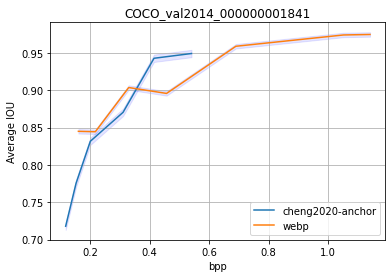

In [404]:
name = 'COCO_val2014_000000001841'
draw_curves(name)

Visualize

In [23]:
def draw_segm(name, codec, quality):
    adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
    input_image = Image.open(adr).convert("RGB")
    if codec == 'webp' or codec == 'jpeg':
        file = f'/home/dariats/Downloads/darknet/img_results/val_results/{name}.json'
        with open(file, 'r') as outfile:
            data = json.load( outfile)
        rec_jpeg, bpp_jpeg = find_closest_bpp(data["deeplabv3"][codec]["curves"][0][quality - 1], input_image,fmt=codec)
        results = net_res(rec_jpeg)
        bpp = bpp_jpeg
    else:
        net = pretrained_models[codec](quality=quality, pretrained=True).eval().to(device)
        image, bpp =img_compress(adr, net, 1)
        results = net_res(image)
    output_predictions = results.argmax(0)
    tr_results =  net_res(Image.open(adr))
    tr_output_predictions = tr_results.argmax(0)

    palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
    colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
    colors = (colors % 255).numpy().astype("uint8")
   
    # plot the semantic segmentation predictions of 21 classes in each color
    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
    r.putpalette(colors)
    tr_r = Image.fromarray(tr_output_predictions.byte().cpu().numpy()).resize(input_image.size)
    tr_r.putpalette(colors)
    return r, tr_r, bpp

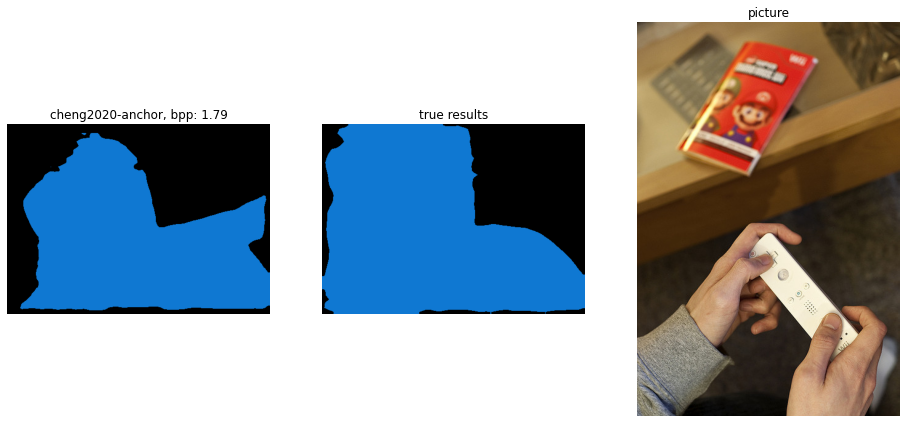

In [263]:

codec = 'cheng2020-anchor'
name = 'COCO_val2014_000000001841'
import matplotlib.pyplot as plt
fix, axes = plt.subplots(1, 3, figsize=(16, 12))
for ax in axes:
    ax.axis('off')
r, tr_r, bpp = draw_segm(name,codec,1 )
axes[0].imshow(r)
axes[0].title.set_text(f'{codec}, bpp: {bpp}')
axes[1].imshow(tr_r)
axes[1].title.set_text('true results')
axes[2].imshow(Image.open(adr))
axes[2].title.set_text('picture')

## Mobilenet v2

In [166]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'mobilenet_v2', pretrained=True)
model.eval()

Using cache found in /home/dariats/.cache/torch/hub/pytorch_vision_v0.10.0
/home/dariats/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [169]:
input_image = Image.open('/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000486.jpg').convert("RGB")
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)
with torch.no_grad():
    output = model(input_batch)
# Tensor of shape 1000, with confidence scores over Imagenet's 1000 classes
print(output[0])
# The output has unnormalized scores. To get probabilities, you can run a softmax on it.
probabilities = torch.nn.functional.softmax(output[0], dim=0)
print(probabilities)

tensor([-1.0690e+00, -2.2788e+00,  8.9831e-01,  1.4953e+00,  1.1816e+00,
        -3.1308e+00, -3.3120e+00,  9.5136e-01,  1.4960e-01, -4.1204e+00,
        -3.2887e+00, -2.0098e+00, -2.3319e+00, -3.7249e+00, -4.8731e+00,
        -9.4694e-01, -2.8023e+00, -2.1978e+00,  7.8710e-01, -2.4261e+00,
        -4.4659e+00, -3.1723e+00, -5.0163e+00,  5.2305e-01, -3.5115e+00,
        -3.6362e+00, -4.8458e+00, -5.1506e+00, -4.1294e+00, -3.4681e+00,
        -1.3988e+00, -1.9279e+00, -3.3890e+00, -2.5566e+00, -1.3361e+00,
        -1.6695e+00, -3.0557e-01, -2.7802e+00, -4.7826e+00,  2.1394e+00,
        -1.7967e+00, -2.9233e+00, -2.9024e-01, -9.5588e-01, -1.9055e+00,
        -3.1010e+00, -2.2073e+00, -1.0162e+00,  9.2191e-01, -4.6881e+00,
        -3.0155e+00,  1.0806e+00, -1.4037e+00, -1.9567e+00,  1.5242e+00,
        -3.0423e+00, -1.1831e+00, -3.1136e+00,  4.7359e-01, -2.8575e+00,
        -1.4235e+00,  8.1063e-01, -1.2244e+00,  1.1811e+00, -2.2875e+00,
         1.7970e+00, -1.5888e+00, -2.3302e+00, -9.8

In [1]:
# Download ImageNet labels
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt


--2022-08-24 17:57:10--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0.002s  

2022-08-24 17:57:10 (4.89 MB/s) - ‘imagenet_classes.txt’ saved [10472/10472]



In [170]:
# Read the categories
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
pred = []
for i in range(top5_prob.size(0)):
    pred.append([categories[top5_catid[i]], top5_prob[i].item()])
print(pred)

[['moped', 0.7393450736999512], ['motor scooter', 0.24697762727737427], ['disk brake', 0.006087994668632746], ['crash helmet', 0.0024884180165827274], ['go-kart', 0.001504041370935738]]


In [90]:
!python3 mobilenet_pred.py

  File "mobilenet_pred.py", line 101
    output = model(input_batch)
                              ^
TabError: inconsistent use of tabs and spaces in indentation


In [95]:
import math
import io
import torch
from torchvision import transforms
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pybboxes as pbx
import json
from pybboxes import BoundingBox
from sklearn.metrics import average_precision_score
import numpy
import matplotlib.pyplot as plt
import os
from scipy import integrate
from numpy import trapz
import random
import cv2

device = 'cuda' if torch.cuda.is_available() else 'cpu'
def compute_bpp(out_net):
    size = out_net['x_hat'].size()
    num_pixels = size[0] * size[2] * size[3]
    return sum(torch.log(likelihoods).sum() / (-math.log(2) * num_pixels)
              for likelihoods in out_net['likelihoods'].values()).item()
       
import torch.nn.functional as F
def pad(x, p=2**6):
    h, w = x.size(2), x.size(3)
    H = (h + p - 1) // p * p
    W = (w + p - 1) // p * p
    padding_left = (W - w) // 2
    padding_right = W - w - padding_left
    padding_top = (H - h) // 2
    padding_bottom = H - h - padding_top
    return padding_left, padding_bottom, F.pad(
        x,
        (padding_left, padding_right, padding_top, padding_bottom),
        mode="constant",
        value=0,
    )
    
    
def pillow_encode(img, fmt='jpeg', quality=10):
    tmp = io.BytesIO()
    img.save(tmp, format=fmt, quality=quality)
    tmp.seek(0)
    filesize = tmp.getbuffer().nbytes
    bpp = filesize * float(8) / (img.size[0] * img.size[1])
    rec = Image.open(tmp).convert("RGB")
    return rec, bpp

def find_closest_bpp(target, img, fmt='jpeg'):
    lower = 0
    upper = 100
    prev_mid = upper
    for i in range(10):
        mid = (upper - lower) / 2 + lower
        if int(mid) == int(prev_mid):
            break
        rec, bpp = pillow_encode(img, fmt=fmt, quality=int(mid))
        if bpp > target:
            upper = mid - 1
        else:
            lower = mid
    return rec, bpp
    


from compressai.zoo import models as pretrained_models
model = torch.hub.load('pytorch/vision:v0.10.0', 'mobilenet_v2', pretrained=True)


def img_compress(adr, net, quality):
    img = Image.open(adr).convert('RGB')
    h, w = img.size
    #x = transforms.ToTensor()(img).unsqueeze(0).to(device)
    h_0, w_0, x = pad(transforms.ToTensor()(img).unsqueeze(0).to(device))
    with torch.no_grad():
        out_net = net.forward(x)
    out_net['x_hat'].clamp_(0, 1) 
    rec_net = transforms.ToPILImage()(out_net['x_hat'].squeeze().cpu()).crop((h_0, w_0, h_0 + h, w_0 + w))
    l = len(adr)
    #change path if need to store compressed pictures
    str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
    rec_net = rec_net.save(str1)
    bpp = round(compute_bpp(out_net), 3)
    return str1, bpp

def net_res(input_image):
    preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), ])
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)
    with torch.no_grad():
        output = model(input_batch)
    # The output has unnormalized scores. To get probabilities, you can run a softmax on it.
    probabilities = torch.nn.functional.softmax(output[0], dim=0)
    with open("imagenet_classes.txt", "r") as f:
        categories = [s.strip() for s in f.readlines()]

    top5_prob, top5_catid = torch.topk(probabilities, 5)
    pred = []
    for i in range(top5_prob.size(0)):
        pred.append([categories[top5_catid[i]], top5_prob[i].item()])
        
    return pred
    
def compute(old_data, adr, model):
    
    names = ['bmshj2018-factorized', 'bmshj2018-hyperprior', 'mbt2018-mean', 'mbt2018', 'cheng2020-anchor', 'cheng2020-attn']
    qual = {'bmshj2018-factorized':9,
            'bmshj2018-hyperprior':9,
            'mbt2018-mean':9,
            'mbt2018':9,
            'cheng2020-anchor':7,
           'cheng2020-attn':7}
    res_data = {}
    res_data['yolov5'] = {}
    res_data['yolov5'] = old_data
    res_data['mobilenet_v2'] = {}
    ##predictions on uncompressed
    data = {}
    
    image = Image.open(adr)
    results = net_res(image)
    data["true objects"] = results
    for name in names:
        bpps = []
        accurs = []
        data[name] = {}
        for quality in range(1,qual[name]):
            net = pretrained_models[name](quality=quality, pretrained=True).eval().to(device)
            adr1, bpp =img_compress(adr, net, quality)
            bpps.append(bpp)
            image = Image.open(adr1)
            results = net_res(image)
            data[name][quality]  = results
            if data["true objects"][0][0] != data[name][quality][0][0]:
            	accur = 0
            else:
            	accur = 1 - abs(data["true objects"][0][1] - data[name][quality][0][1])
            accurs.append(accur)
        data[name]["curves"] = {}
        data[name]["curves"] = [bpps, accurs]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[name]["integrate"] = integrate.trapz(accurs, bpps)/x
        if name != 'cheng2020-anchor' and name != 'cheng2020-attn':
            target_bpps = bpps

    
    names = ["webp", "jpeg"]
    for name in names:
        bpps = []
        accurs = []
        data[name] = {}
        for quality in range(1,9):
            img = Image.open(adr).convert('RGB')
            target_bpp = target_bpps[quality - 1]
            rec_jpeg, bpp_jpeg = find_closest_bpp(target_bpp, img,fmt=name)
            #change path if need to store compressed pictures
            #example
            #str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/{name}/{quality}/{adr[-29:-4]}.png'
            str1 = f'/home/dariats/Downloads/darknet/coco/images2014_compressed/quality{quality}.png'
            #rec_jpeg = rec_jpeg.save(str1)
            bpps.append(bpp_jpeg)
            results = net_res(rec_jpeg)
            data[name][quality]  = results
            if data["true objects"][0][0] != data[name][quality][0][0]:
            	accur = 0
            else:
            	accur = 1 - abs(data["true objects"][0][1] - data[name][quality][0][1])
            accurs.append(accur)
        data[name]["curves"] = {}
        data[name]["curves"] = [bpps, accurs]
        x = bpps[len(bpps) - 1]- bpps[0]
        data[name]["integrate"] = integrate.trapz(accurs, bpps)/x
        
    res_data['mobilenet_v2'] = data  
    return res_data
    
#if name == "__main__":
model.eval()
#path to file with image adresses    
f = open('/home/dariats/Downloads/darknet/coco/temp2.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    adr = line[:-1]
    res_data = compute(data, adr, model)
    with open(file, 'w') as outfile:
        json.dump(res_data, outfile)
    print(line[-30:-5])
f.close()

/home/dariats/.local/lib/python3.8/site-packages/torch/amp/autocast_mode.py:198: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')
Using cache found in /home/dariats/.cache/torch/hub/pytorch_vision_v0.10.0
/home/dariats/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/dariats/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


COCO_val2014_000000012947
COCO_val2014_000000012959
COCO_val2014_000000012979
COCO_val2014_000000012991
COCO_val2014_000000013031
COCO_val2014_000000013061
COCO_val2014_000000013081
COCO_val2014_000000013127
COCO_val2014_000000013132
COCO_val2014_000000013145
COCO_val2014_000000013148
COCO_val2014_000000013159
COCO_val2014_000000013168
COCO_val2014_000000013175
COCO_val2014_000000013177
COCO_val2014_000000013201
COCO_val2014_000000013220
COCO_val2014_000000013232
COCO_val2014_000000013291
COCO_val2014_000000013296
COCO_val2014_000000013300
COCO_val2014_000000013348
COCO_val2014_000000013379
COCO_val2014_000000013383
COCO_val2014_000000013414
COCO_val2014_000000013415
COCO_val2014_000000013420
COCO_val2014_000000013428
COCO_val2014_000000013432
COCO_val2014_000000013445
COCO_val2014_000000013465
COCO_val2014_000000013473
COCO_val2014_000000013490
COCO_val2014_000000013525
COCO_val2014_000000013546
COCO_val2014_000000013550
COCO_val2014_000000013597
COCO_val2014_000000013605
COCO_val2014

FileNotFoundError: [Errno 2] No such file or directory: '/home/dariats/Downloads/darknet/img_results/val_results/.json'

 F1 fixing

In [ ]:
def f5_accur(true_res, res):
    a = [0.5, 0.25, 0.125, 0.0625, 0.0625]
    accur = 0
    for i in range(5):
        for j in range(5):
            if res[i][0] == true_res[j][0]:
                d = res[i][1]/true_res[j][1]
                if (d > 1):
                    d = 1/d
                k = i+abs(i-j)
                if k >4: 
                    k = 4
                accur += d*a[k]
                break
    return accur

In [334]:

f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        res_data = json.load(outfile)
    adr = line[:-1]
    data = res_data["mobilenet_v2"]
    for key in data:
        accurs = []
        if key != 'true objects':
            bpps = data[key]["curves"][0]
            for quality in range(1, len(bpps) + 1):
                accurs.append(f5_accur(data["true objects"], data[key][str(quality)]))
            data[key]["curves"][1] = accurs
            x = bpps[len(bpps) - 1]- bpps[0]
            data[key]["integrate"] = integrate.trapz(accurs, bpps)/x
    res_data["mobilenet_v2"] = data
    with open(file, 'w') as outfile:
        json.dump(res_data, outfile)
    #print(line[-30:-5])
f.close()

Adding integrate

In [16]:
f = open('/home/dariats/Downloads/darknet/coco/temp2.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    #print(file)
    with open(file, 'r') as outfile:
        res_data = json.load(outfile)
    adr = line[:-1]
    for key in res_data:
        bpps = res_data[key]["webp"]["curves"][0][:6]
        accurs = res_data[key]["webp"]["curves"][1][:6]
        x = bpps[len(bpps) - 1]- bpps[0]
        res_data[key]["webp"]["integrate2"] = integrate.trapz(accurs, bpps)/x
    with open(file, 'w') as outfile:
        json.dump(res_data, outfile)
    #print(line[-30:-5])
f.close()

In [3]:
file = f'/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000042.json'
    #print(file)
with open(file, 'r') as outfile:
    res_data = json.load(outfile)
print(res_data['deeplabv3']['webp']['integrate'], res_data['deeplabv3']['webp']['integrate2'])

0.8483350269064998 0.6964946533811673


In [17]:
files = []
values = []
dir_name = '/home/dariats/Downloads/darknet/img_results/val_results/'
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
for line in f:
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    print(file)
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    value = data["mobilenet_v2"]["cheng2020-anchor"]["integrate"] -data["mobilenet_v2"]["webp"]["integrate2"]
    files.append(file)
    values.append(value)

indices = sorted(range(len(values)), key=lambda i: values[i])
mobilenet_arr = []
for i in indices:
    if values[i]< 0:
        mobilenet_arr.append(os.path.join('/home/dariats/Downloads/darknet/coco/images/val2014/', files[i][-30:-4]+'jpg'))
    #print(files[i], ': ', values[i])
print(mobilenet_arr)

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000042.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000073.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000074.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000133.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000136.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000139.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000143.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000196.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000208.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000241.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000000257.json
/home/dariats/Downloads/darknet/img_results

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002839.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002867.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002881.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002890.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002923.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002985.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000002988.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000003001.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000003014.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000003067.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000003091.json
/home/dariats/Downloads/darknet/img_results

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005728.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005754.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005758.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005802.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005816.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005820.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005860.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005879.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005934.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005961.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000005965.json
/home/dariats/Downloads/darknet/img_results

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009274.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009275.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009288.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009317.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009378.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009379.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009381.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009395.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009400.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009420.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000009426.json
/home/dariats/Downloads/darknet/img_results

/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012639.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012666.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012667.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012669.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012670.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012700.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012706.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012731.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012733.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012741.json
/home/dariats/Downloads/darknet/img_results/val_results/COCO_val2014_000000012748.json
/home/dariats/Downloads/darknet/img_results

['/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001647.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002495.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000008888.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001841.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000009647.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000009800.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000009603.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006861.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002014.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000007511.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001398.jpg', '/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val201

In [126]:
def draw_curves(name, network, save = False):
    file = f'/home/dariats/Downloads/darknet_new/img_results/val_results/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    
    data = data[network]
    """print("true: ", data["true objects"])
    print("cheng: " , data["cheng2020-anchor"]['3'])
    print("webp: ", data["webp"]['3'])"""
    for key in data:
        if key != "true objects" and (key == "cheng2020-anchor" or key == 'webp'):
            value = data[key]["curves"]
            value[0] = value[0][:6]
            value[1] = value[1][:6]
            plt.plot(value[0], value[1], label = key)
            ci = 0.05 * np.std(value[1]) / np.mean(value[1])
            #print(ci)
            #ax = sns.lineplot(value[0], value[1])
            plt.fill_between(value[0], (value[1]-ci), (value[1]+ci), color='blue', alpha=0.1)
            #print(key,':', data[key]["integrate"])
    plt.xlabel('bpp')
    if network == 'mobilenet_v2':
        plt.ylabel('Top1-accuracy')
    else:
        plt.ylabel('Average IOU')
    plt.title(network)
    plt.legend()
    plt.grid()
    if save:
        plt.savefig(f'/home/dariats/Downloads/darknet/mobilenet/webp/{name}.png', facecolor = 'white')
   # plt.show()
    
    

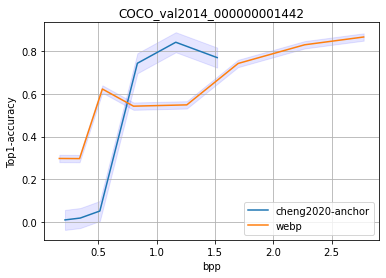

In [479]:
name = 'COCO_val2014_000000001442'
draw_curves(name, 'mobilenet_v2')

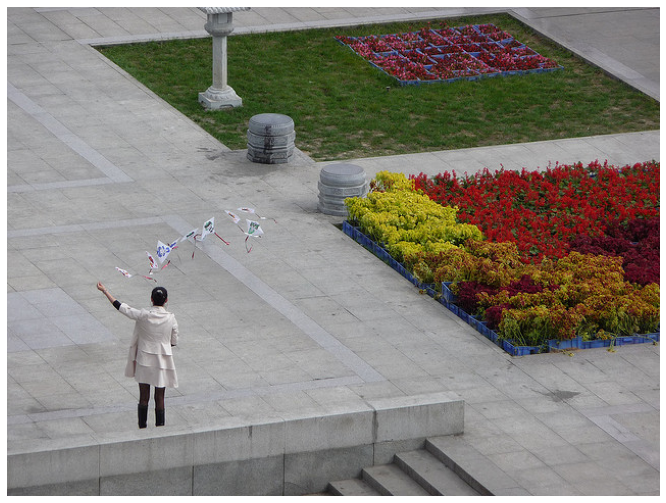

In [235]:
%matplotlib inline
plt.figure(figsize=(12, 9))
plt.axis('off')
#adr = f'/home/dariats/Downloads/darknet/coco/images/val2014/{name}.jpg'
adr = arr1[5]
image = Image.open(adr).convert("RGB")
plt.imshow(image)
plt.show()

In [27]:
def get_detect(name, codec, quality):
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{name}.json'
    with open(file, 'r') as outfile:
        data = json.load(outfile)
    if codec == 'true':
        return _, data["mobilenet_v2"]['true objects']
    return data["mobilenet_v2"][codec]["curves"][0][int(quality) - 1], data["mobilenet_v2"][codec][quality]

In [333]:
def f5_accur(true_res, res):
    a = [0.5, 0.25, 0.125, 0.0625, 0.0625]
    accur = 0
    for i in range(5):
        for j in range(5):
            if res[i][0] == true_res[j][0]:
                d = res[i][1]/true_res[j][1]
                if (d > 1):
                    d = 1/d
                k = i+abs(i-j)
                if k >4: 
                    k = 4
                accur += d*a[k]
                break
    return accur

In [329]:
name = 'COCO_val2014_000000007202'
file = f'/home/dariats/Downloads/darknet/img_results/val_results/{name}.json'
with open(file, 'r') as outfile:
    data = json.load(outfile)
print(data["mobilenet_v2"]['true objects'])
print(data["mobilenet_v2"]['cheng2020-anchor']['4'])

print(f5_accur(data["mobilenet_v2"]['true objects'], data["mobilenet_v2"]['cheng2020-anchor']['4']))


[['stove', 0.639678418636322], ['dishwasher', 0.13192066550254822], ['microwave', 0.09329104423522949], ['washer', 0.089152492582798], ['refrigerator', 0.00910793524235487]]
[['stove', 0.9289212226867676], ['dishwasher', 0.0394819900393486], ['microwave', 0.019125008955597878], ['washer', 0.00276589416898787], ['refrigerator', 0.0017400063807144761]]
0
0.34431252242582344
0.4191339878288045
0.4447594499409218
0.44669846903678384
0.4586386504171839


In [330]:
print(data["mobilenet_v2"]['true objects'])
print(data["mobilenet_v2"]['webp']['4'])
print(f5_accur(data["mobilenet_v2"]['true objects'], data["mobilenet_v2"]['webp']['4']))

[['stove', 0.639678418636322], ['dishwasher', 0.13192066550254822], ['microwave', 0.09329104423522949], ['washer', 0.089152492582798], ['refrigerator', 0.00910793524235487]]
[['stove', 0.9124153256416321], ['microwave', 0.0500752292573452], ['dishwasher', 0.015458398498594761], ['safe', 0.0027232272550463676], ['washer', 0.0025596944615244865]]
0
0.35054125060124625
0.4176366905599343
0.4249604097246433
0.4249604097246433
0.42675487333649015


## Pictures with low metrics

In [19]:
res = []
for obj in yolov5_arr:
    if obj in deeplab_arr and obj in mobilenet_arr:
        print(obj)
        res.append(obj)

/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000502.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000002690.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006854.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000005146.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000001205.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000014845.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000007961.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000000885.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000012147.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000005694.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000015862.jpg
/home/dariats/Downloads/darknet/coco/images/val2014/COCO_val2014_000000006028.jpg
/home/dariats/Do

In [60]:
res= high_deform_arr

KeyError: 'webp'

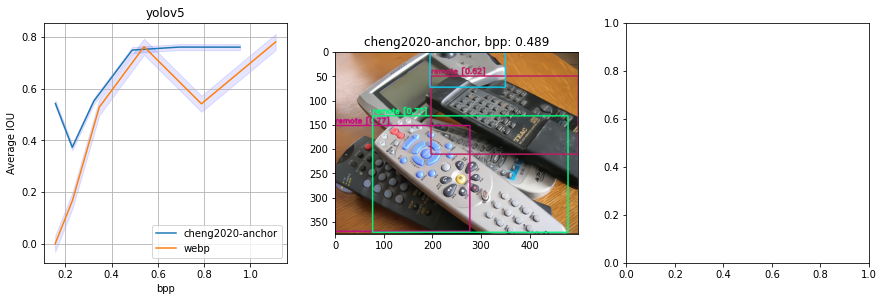

In [127]:
import matplotlib.pyplot as plt
i = 17
#name = res[i][-29:-4]

name = 'COCO_val2014_000000013061'
plt_box = plt.figure(figsize=(20,15))
quality = 4
plt_box.add_subplot(3,4,1)
draw_curves(name, 'yolov5')

plt_box.add_subplot(3,4,2)
image, bpp = draw_boxes(name, 'cheng2020-anchor', str(quality))
plt.imshow(image)
plt.title(f'cheng2020-anchor, bpp: {bpp}')

plt_box.add_subplot(3,4,3)
image, bpp = draw_boxes(name, 'webp', str(quality))
plt.imshow(image)
plt.title(f'webp, bpp: {bpp}')

plt_box.add_subplot(3,4,4)

image, _ = draw_boxes(name, '', '', gt = True)
plt.imshow(image)
plt.title('true results')

plt_box.add_subplot(3,4,5)
draw_curves(name, 'deeplabv3')
codec = 'cheng2020-anchor'
quality = 5
r, _, bpp = draw_segm(name,codec,quality )

plt_box.add_subplot(3,4,6)
plt.imshow(r)
plt.title(f'{codec}, bpp: {bpp}')

plt_box.add_subplot(3,4,7)
codec = 'webp'
r, tr_r, bpp = draw_segm(name,codec,quality )
plt.imshow(r)
plt.title(f'{codec}, bpp: {round(bpp, 3)}')


plt_box.add_subplot(3,4,8)
plt.imshow(tr_r)
plt.title('true results')

plt_box.add_subplot(3,4,9)
draw_curves(name, 'mobilenet_v2')
quality = 6
plt_box.add_subplot(3,4,10)
codec = 'cheng2020-anchor'
bpp, pred =get_detect(name,codec , str(quality))
plt.text(0.1,0.8,pred[0])
plt.text(0.1,0.7,pred[1])
plt.text(0.1,0.6,pred[2])
plt.text(0.1,0.5,pred[3])
plt.text(0.1,0.4,pred[4])
plt.title(f'{codec}, bpp: {round(bpp, 3)}')

plt_box.add_subplot(3,4,11)
codec = 'webp'
bpp, pred =get_detect(name, codec, str(quality))
plt.text(0.1,0.8,pred[0])
plt.text(0.1,0.7,pred[1])
plt.text(0.1,0.6,pred[2])
plt.text(0.1,0.5,pred[3])
plt.text(0.1,0.4,pred[4])
plt.title(f'{codec}, bpp: {round(bpp, 3)}')

plt_box.add_subplot(3,4,12)
_, pred =get_detect(name, 'true', str(quality))
plt.text(0.1,0.8,pred[0])
plt.text(0.1,0.7,pred[1])
plt.text(0.1,0.6,pred[2])
plt.text(0.1,0.5,pred[3])
plt.text(0.1,0.4,pred[4])
plt.title('true results')



#plt.savefig(f'/home/dariats/Downloads/darknet/curves/low-cheng/{name}.png', facecolor = 'white', bbox_inches = 'tight')
plt.show()

In [34]:
f = open('/home/dariats/Downloads/darknet/coco/val1000.txt', 'r')
arr = []
for line in f:
    image = Image.open(line[:-1])
    file = f'/home/dariats/Downloads/darknet/img_results/val_results/{line[-30:-5]}.json'
    with open(file, 'r') as outfile:
        data = json.load( outfile)
    data["inf"] = {}
    data["inf"]["image size"] = image.size
    with open(file, 'w') as outfile:
        json.dump(data, outfile)
    arr.append(image.size)
    
print(list(set(arr)))
    
    

[(612, 612), (414, 640), (504, 640), (559, 640), (640, 512), (640, 338), (640, 457), (640, 347), (640, 640), (640, 466), (640, 411), (640, 420), (640, 539), (640, 484), (500, 364), (500, 318), (481, 640), (640, 441), (500, 370), (640, 395), (640, 459), (468, 640), (500, 400), (640, 404), (640, 349), (640, 468), (428, 640), (640, 596), (640, 477), (404, 640), (500, 302), (320, 225), (431, 431), (360, 270), (640, 315), (500, 375), (640, 324), (640, 443), (640, 507), (551, 640), (640, 516), (640, 580), (640, 406), (511, 640), (640, 479), (600, 400), (640, 436), (500, 496), (317, 640), (640, 445), (383, 640), (640, 390), (640, 509), (640, 573), (640, 399), (638, 640), (640, 463), (640, 408), (640, 536), (464, 640), (640, 429), (424, 640), (435, 640), (640, 493), (479, 640), (640, 374), (640, 438), (600, 640), (640, 383), (640, 328), (640, 447), (640, 511), (500, 281), (640, 593), (500, 345), (400, 267), (500, 363), (485, 500), (640, 376), (640, 321), (500, 500), (640, 385), (640, 449), (64